In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cptac
import binarization_functions as bf
import gseapy as gp
from gseapy.plot import barplot, heatmap, dotplot
import json
import requests
import random
import deva

In [3]:
cptac.download(dataset='Endometrial')
en = cptac.Endometrial()
derived_mol = en.get_derived_molecular()
transcriptomics = en.get_transcriptomics()
clinical = en.get_clinical()

## Step 2: Data Cleaning and Choosing Attributes to A/B Test
First, we will drop columns we are not interested in, and then make each of the columns binary

In [4]:
cols_to_drop = ['Gender', 'Tumor_Site_Other', 
                'Tumor_Site', 'Patient_ID', 
                'Country', 'Treatment_naive', 
                'Age', 'Race', 'Ethnicity', 
                'Num_full_term_pregnancies']

for col in clinical.columns:
    if len(clinical[col].value_counts()) < 2:
        cols_to_drop.append(col)

annotations = clinical.copy()
annotations = annotations.drop(cols_to_drop, axis=1)
annotations['Genomics_subtype'] = derived_mol['Genomics_subtype']

In [5]:
# Minor Data Cleaning

annotations['Myometrial_invasion_Specify'] = annotations['Myometrial_invasion_Specify'].replace('Not identified', np.nan)
annotations['Clin_Stage_Dist_Mets-cM'] = annotations['Clin_Stage_Dist_Mets-cM'].replace('Staging Incomplete', np.nan)
annotations['Path_Stage_Dist_Mets-pM'] = annotations['Path_Stage_Dist_Mets-pM'].replace('Staging Incomplete', np.nan)
annotations['Diabetes'] = annotations['Diabetes'].replace('Unknown', np.nan)

annotations['BMI'] = bf.binarizeRange(annotations, 'BMI', 18.5, 25, 'Healthy_BMI', 'Unhealthy_BMI')
annotations['LVSI'] = annotations['LVSI'].map({0.0:"No", 1.0:"Yes"})

for col in annotations.columns:
    if np.issubdtype(annotations[col].dtype, np.number):
        mean = annotations[col].mean()
        annotations[col]= bf.binarizeCutOff(annotations, col, mean,
                                            "Above_Mean("+str(round(mean, 2))+")",
                                            "Below_Mean("+str(round(mean, 2))+")")

In [6]:
annotations = deva.binarize_annotations(annotations)

## Step 3: Perform Outlier Analysis
Using the Blacksheep-outliers package, deva, we will create two tables: one of all the significant up-regulated genes per patient (which we will call outliers), and one of the q-values for significantly enriched genes based on our binarized clinical attributes (which we will call qvalues).

In [7]:
outliers, qvalues = deva.run_outliers(transcriptomics.transpose(), 
                                      annotations,
                                      up_or_down='up',
                                      aggregate=False)

09/07/2019 14:14:22:WARNING:These samples were not found in outliers table: S109, S110, S112, S113, S114, S115, S116, S117, S118, S123, S126, S130, S131, S132, S133, S134, S135, S136, S137, S138, S139, S140, S141, S142, S143, S144, S145, S146, S147, S148, S149, S150, S151, S152, S153, continuing without them. 
09/07/2019 14:14:23:WARNING:No rows tested for fisherFDR_Proteomics_Tumor_Normal_Tumor_Tumor
09/07/2019 14:14:29:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Adjacent-normal
09/07/2019 14:14:29:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Enriched-normal
09/07/2019 14:14:29:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Myometrium-normal
09/07/2019 14:15:01:WARNING:No rows tested for fisherFDR_Path_Stage_Primary_Tumor-pT_pT1b (FIGO IB)_not-pT1b (FIGO IB)
09/07/2019 14:15:14:WARNING:No rows tested for fisherFDR_Path_Stage_Primary_Tumor-pT_pT3a (FIGO IIIA)_not-pT3a (FIGO III

In [8]:
outliers_down, qvalues_down = deva.run_outliers(transcriptomics.transpose(), 
                                                annotations, 
                                                up_or_down='down', 
                                                aggregate=False)

09/07/2019 14:18:27:WARNING:These samples were not found in outliers table: S109, S110, S112, S113, S114, S115, S116, S117, S118, S123, S126, S130, S131, S132, S133, S134, S135, S136, S137, S138, S139, S140, S141, S142, S143, S144, S145, S146, S147, S148, S149, S150, S151, S152, S153, continuing without them. 
09/07/2019 14:18:27:WARNING:No rows tested for fisherFDR_Proteomics_Tumor_Normal_Tumor_Tumor
09/07/2019 14:18:32:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Adjacent-normal
09/07/2019 14:18:32:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Enriched-normal
09/07/2019 14:18:32:ERROR:There are not exactly 2 groups of samples, skipping Proteomics_Tumor_Normal_Myometrium-normal
09/07/2019 14:18:33:WARNING:No rows tested for fisherFDR_Histologic_Grade_FIGO_FIGO grade 2_not-FIGO grade 2
09/07/2019 14:18:33:WARNING:No rows tested for fisherFDR_Histologic_Grade_FIGO_FIGO grade 1_FIGO grade 1
09/07/2019 14:18:34:WARNI

In [9]:
length = int(len(outliers.df.columns) / 2)
temp_outliers = outliers.df.transpose()
only_outliers_up = temp_outliers[:length]
outliers_up_dict = {}
for i in range(length):
    key = transcriptomics.index[i]
    my_filter = only_outliers_up.iloc[i] == 1.0
    value = list(only_outliers_up.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_up_dict[key] = value

In [10]:
length = int(len(outliers_down.df.columns) / 2)
temp_outliers_down = outliers_down.df.transpose()
only_outliers_down = temp_outliers_down[:length]
outliers_down_dict = {}
for i in range(length):
    key = transcriptomics.index[i]
    my_filter = only_outliers_down.iloc[i] == 1.0
    value = list(only_outliers_down.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_down_dict[key] = value

## Step 4: Visualize these enrichments

First, we will determine which clinical attributes have significant enrichments, and save them to a list for both up-regulated outliers, and down-regulated outliers.

In [11]:
#Drop Columns with less than 4 significant up-regulated enrichments
sig_cols_up = []
for col in qvalues.df.columns:
    sig_col = bf.significantEnrichments(qvalues.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_up.append(sig_col)
    else:
        results_up = qvalues.df.drop(col, axis=1)

In [12]:
#Drop Columns with less than 4 significant down-regulated enrichments
sig_cols_down = []
for col in qvalues_down.df.columns:
    sig_col = bf.significantEnrichments(qvalues_down.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_down.append(sig_col)
    else:
        results_down = qvalues_down.df.drop(col, axis=1)

In [13]:
#Here we will link clinical attributes with significantly up-regulated genes
sig_genes_up = {}
for i, col in enumerate(sig_cols_up):
    list_of_genes = list(col.index)
    sig_genes_up[sig_cols_up[i].columns[0][:-9]] = list_of_genes

In [14]:
#And then down-regulated genes
sig_genes_down = {}
for i, col in enumerate(sig_cols_down):
    list_of_genes = list(col.index)
    sig_genes_down[sig_cols_down[i].columns[0][:-9]] = list_of_genes

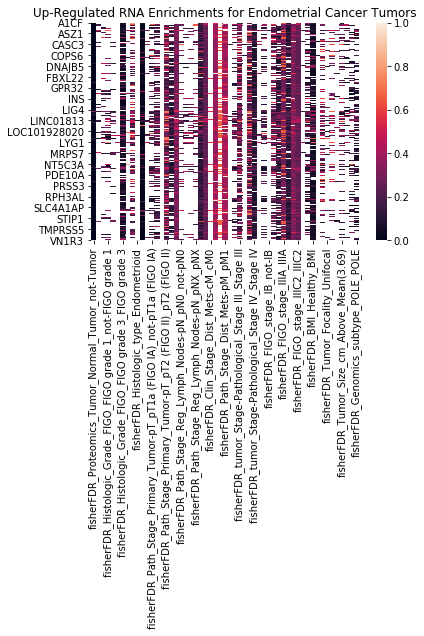

In [15]:
#Simple visualization
ax1 = plt.axes()
sns.heatmap(results_up, ax = ax1)
ax1.set_title('Up-Regulated RNA Enrichments for Endometrial Cancer Tumors')
plt.show()

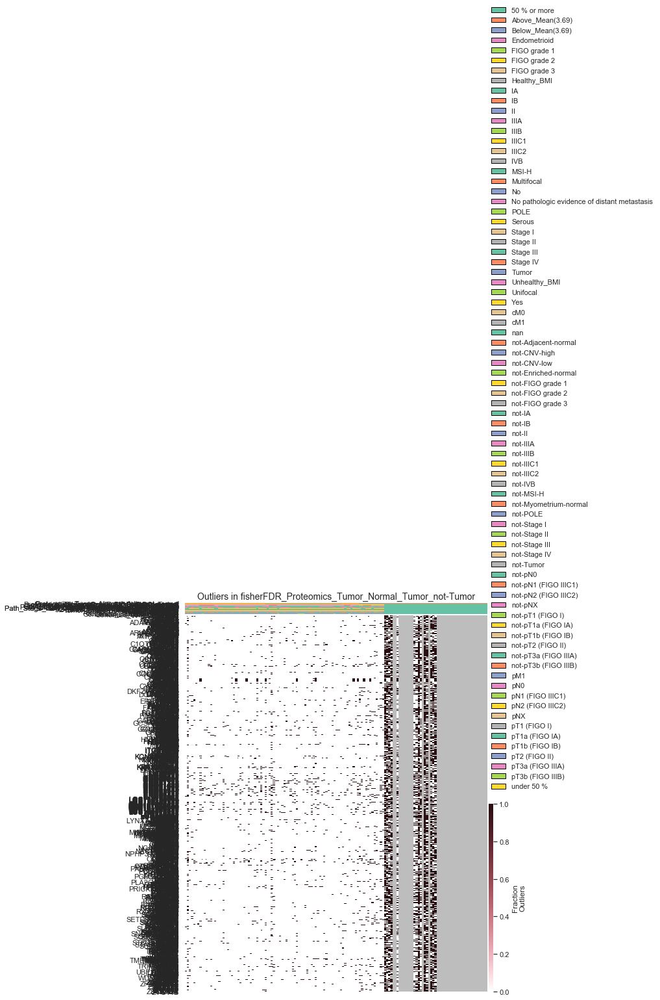

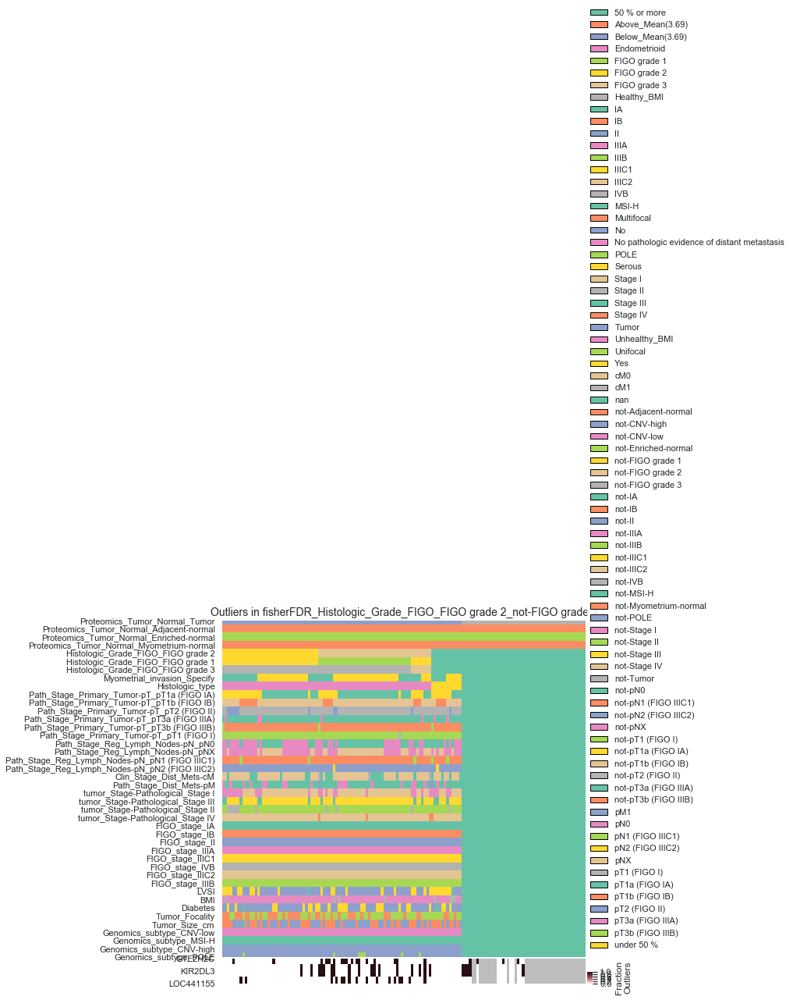

09/07/2019 14:21:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Histologic_Grade_FIGO_FIGO grade 2_FIGO grade 2


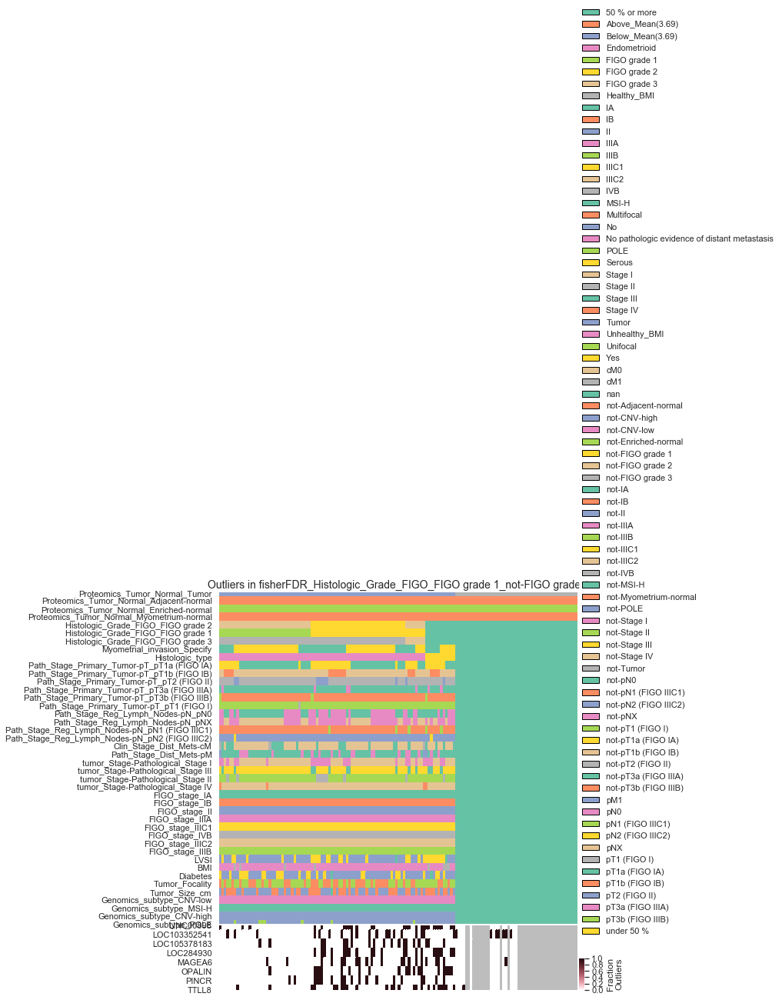

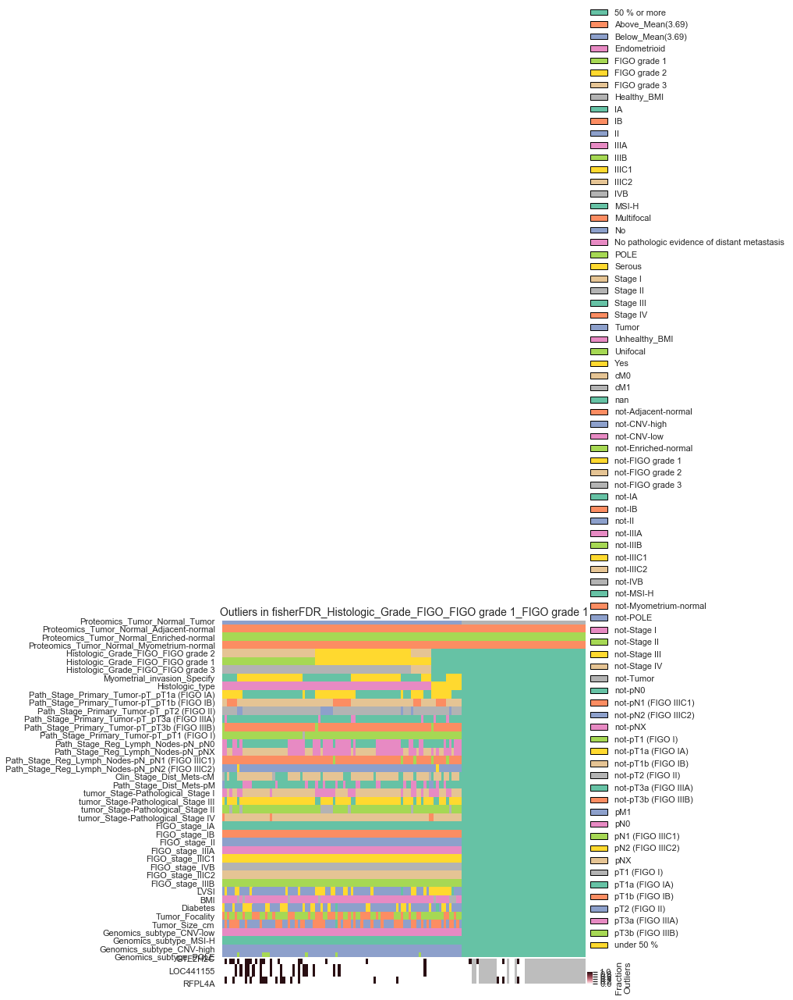

09/07/2019 14:22:05:WARNING:No significant genes at FDR 0.05 in fisherFDR_Histologic_Grade_FIGO_FIGO grade 3_not-FIGO grade 3


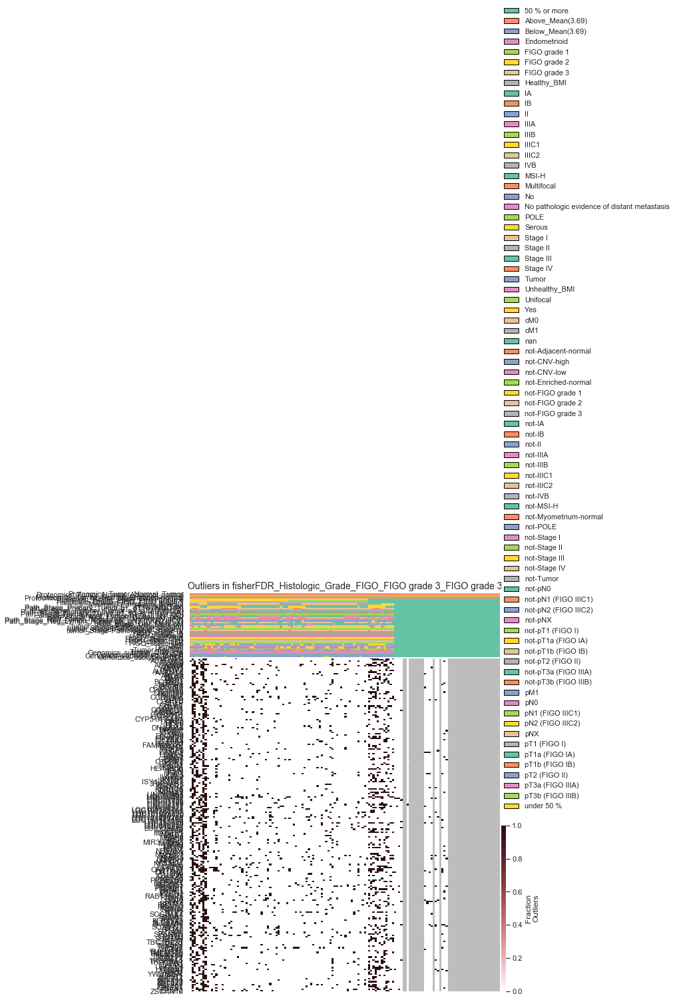

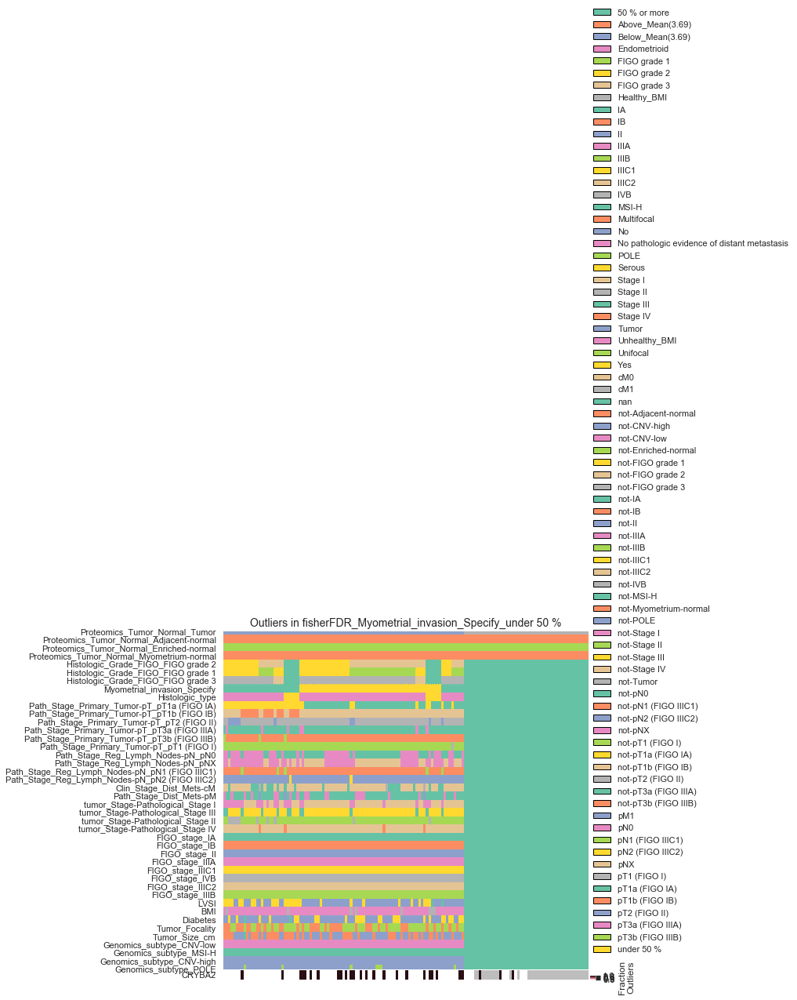

09/07/2019 14:22:31:WARNING:No significant genes at FDR 0.05 in fisherFDR_Myometrial_invasion_Specify_50 % or more
09/07/2019 14:22:31:WARNING:No significant genes at FDR 0.05 in fisherFDR_Histologic_type_Endometrioid


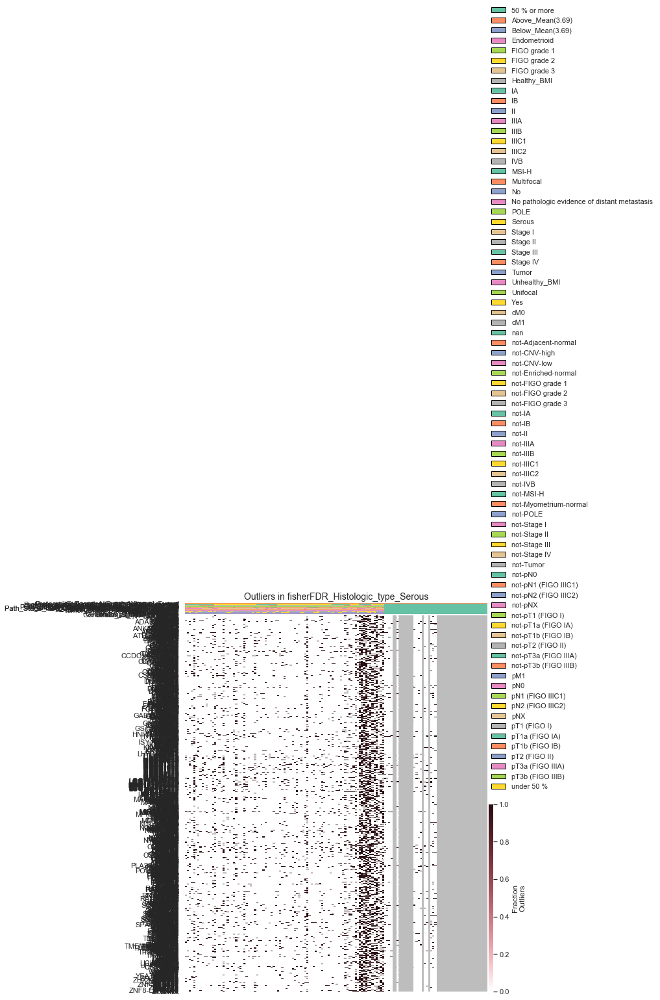

09/07/2019 14:24:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT1a (FIGO IA)_pT1a (FIGO IA)
09/07/2019 14:24:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT1a (FIGO IA)_not-pT1a (FIGO IA)
09/07/2019 14:24:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT1b (FIGO IB)_pT1b (FIGO IB)
09/07/2019 14:24:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT2 (FIGO II)_not-pT2 (FIGO II)
09/07/2019 14:24:12:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT2 (FIGO II)_pT2 (FIGO II)
09/07/2019 14:24:12:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT3a (FIGO IIIA)_pT3a (FIGO IIIA)
09/07/2019 14:24:12:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT3b (FIGO IIIB)_pT3b (FIGO IIIB)


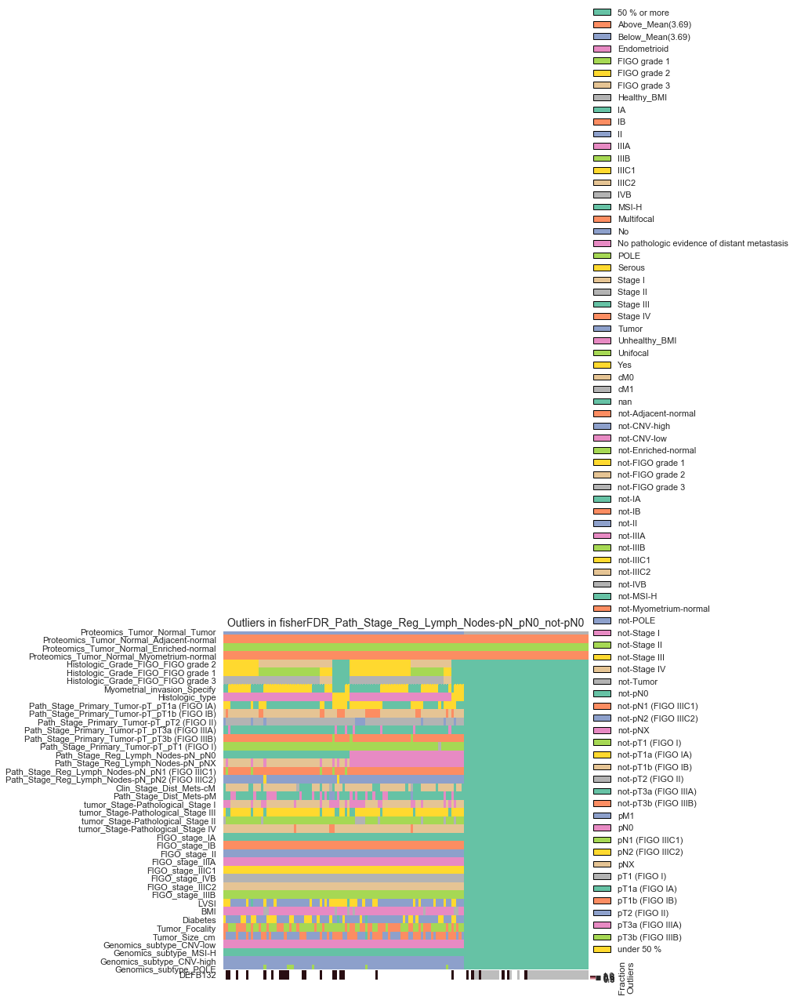

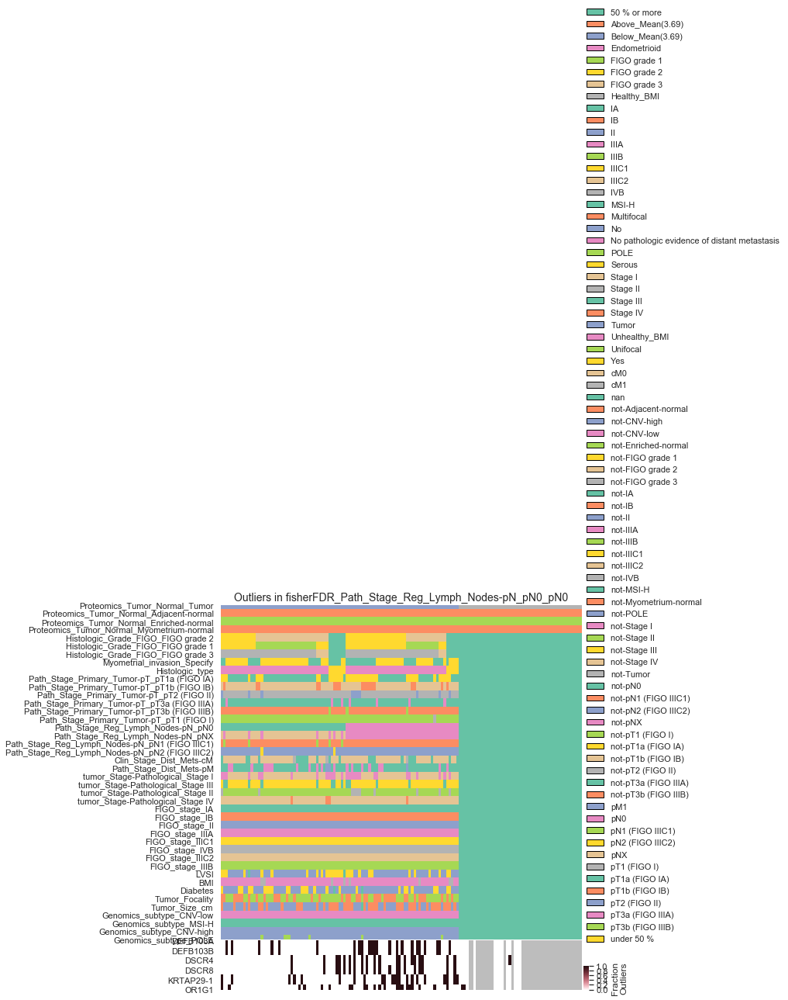

09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pNX_not-pNX
09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pNX_pNX
09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pN1 (FIGO IIIC1)_pN1 (FIGO IIIC1)
09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pN2 (FIGO IIIC2)_pN2 (FIGO IIIC2)
09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Clin_Stage_Dist_Mets-cM_cM0
09/07/2019 14:24:32:WARNING:No significant genes at FDR 0.05 in fisherFDR_Clin_Stage_Dist_Mets-cM_cM1
09/07/2019 14:24:33:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Dist_Mets-pM_No pathologic evidence of distant metastasis
09/07/2019 14:24:33:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Dist_Mets-pM_pM1
09/07/2019 14:24:33:WARNING:No significant gene

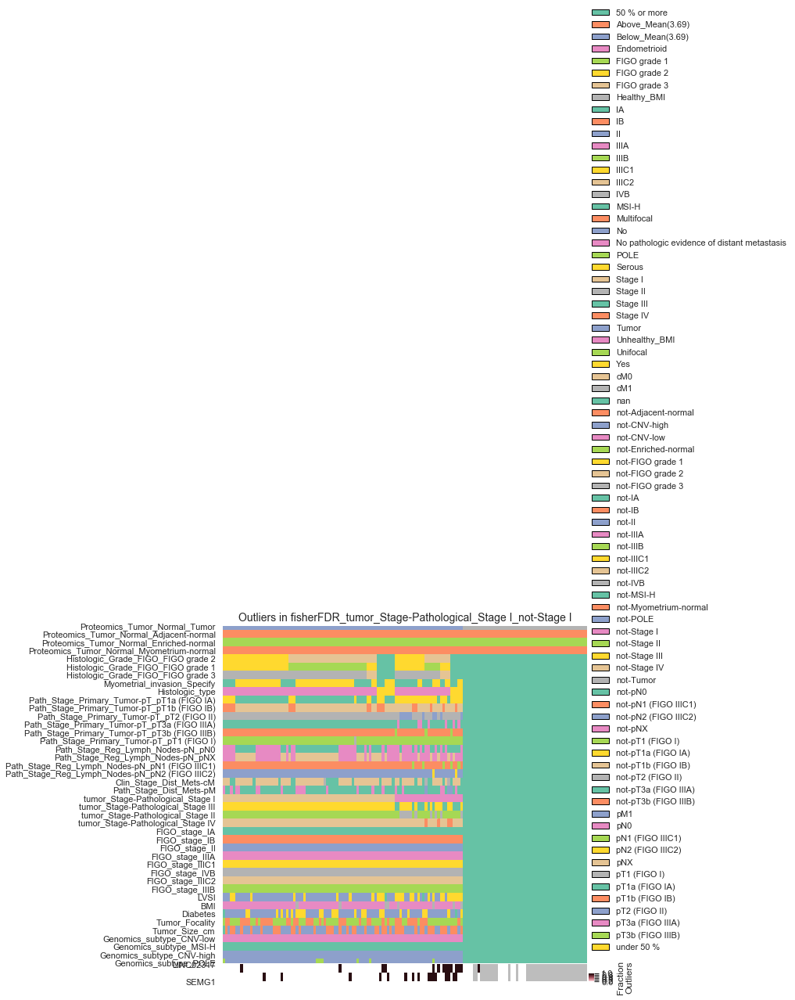

09/07/2019 14:24:44:WARNING:No significant genes at FDR 0.05 in fisherFDR_tumor_Stage-Pathological_Stage III_Stage III
09/07/2019 14:24:44:WARNING:No significant genes at FDR 0.05 in fisherFDR_tumor_Stage-Pathological_Stage II_not-Stage II
09/07/2019 14:24:44:WARNING:No significant genes at FDR 0.05 in fisherFDR_tumor_Stage-Pathological_Stage II_Stage II
09/07/2019 14:24:44:WARNING:No significant genes at FDR 0.05 in fisherFDR_tumor_Stage-Pathological_Stage IV_Stage IV
09/07/2019 14:24:45:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IA_IA


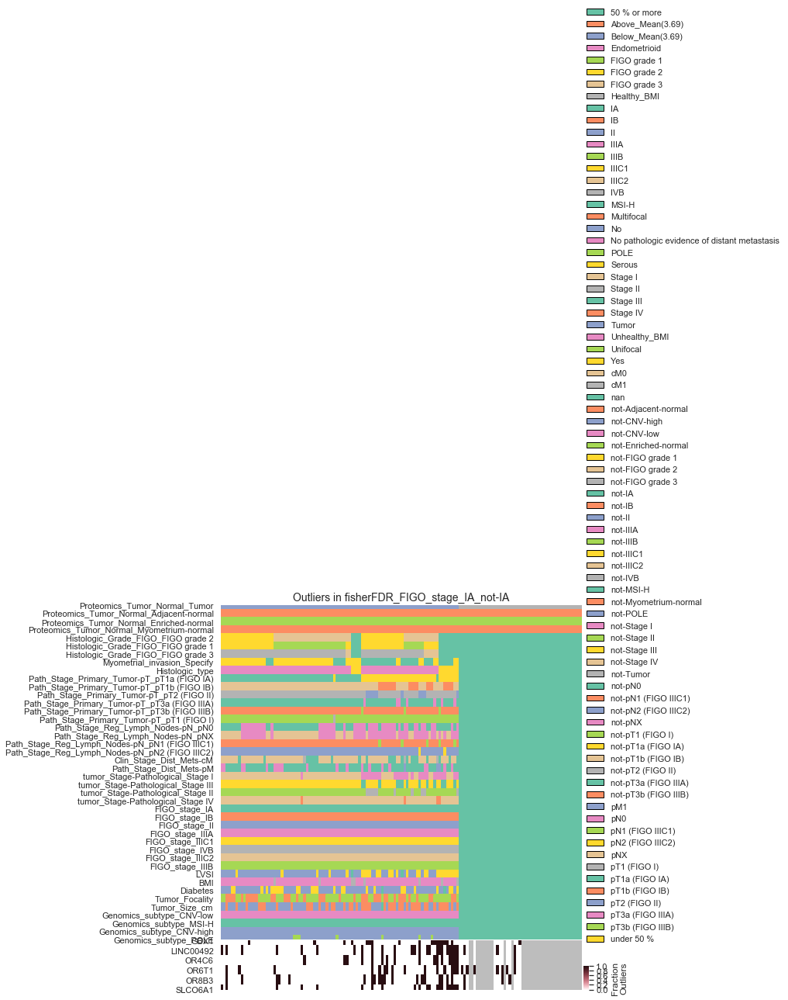

09/07/2019 14:24:54:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IB_not-IB
09/07/2019 14:24:54:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IB_IB


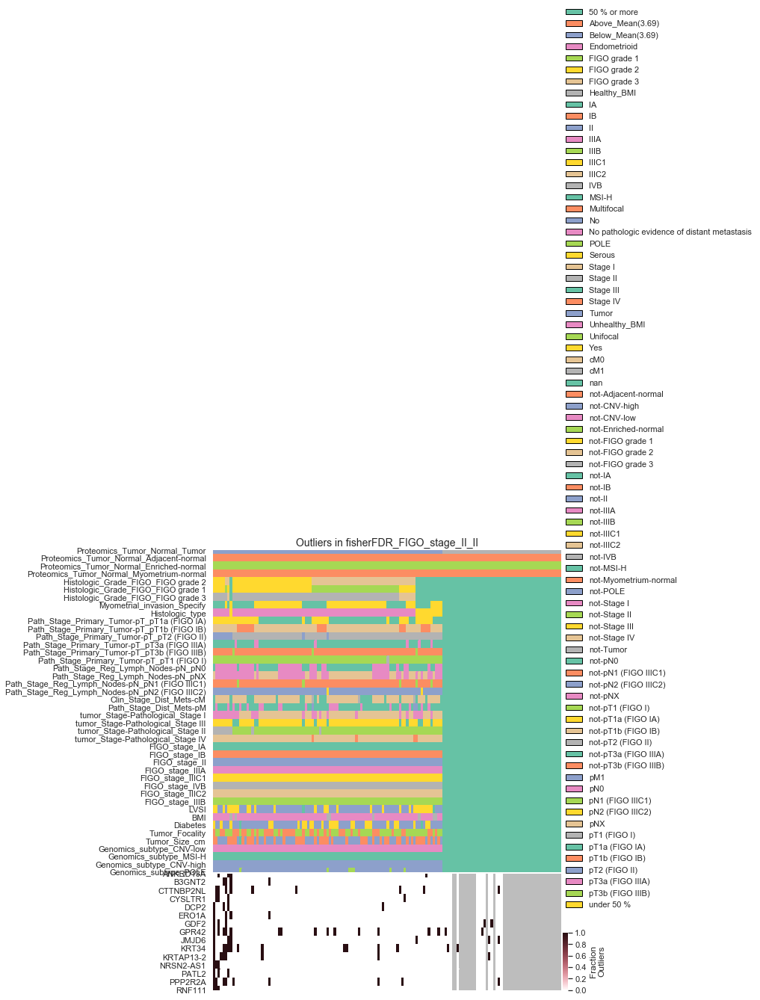

09/07/2019 14:25:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IIIA_IIIA
09/07/2019 14:25:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IIIC1_IIIC1
09/07/2019 14:25:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IVB_IVB
09/07/2019 14:25:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IIIC2_IIIC2
09/07/2019 14:25:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_LVSI_No


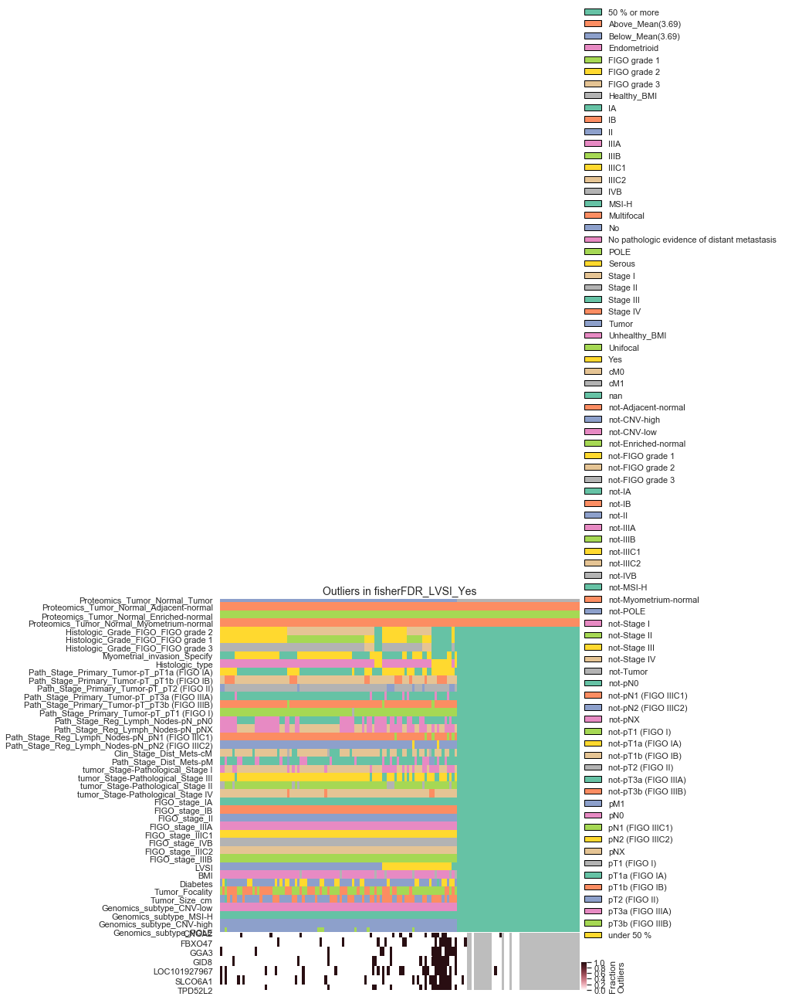

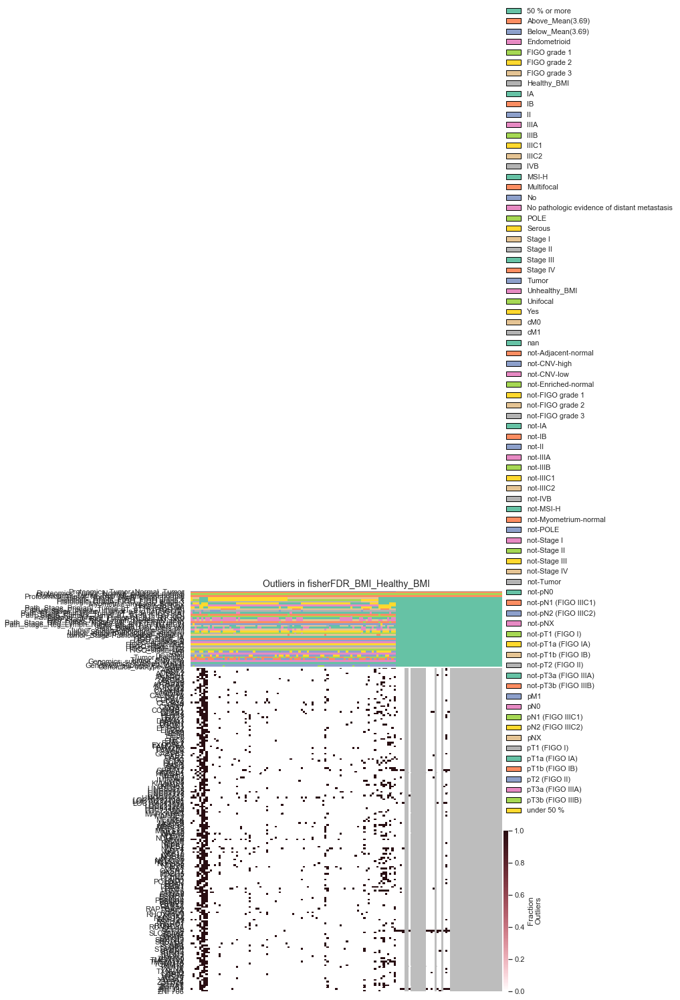

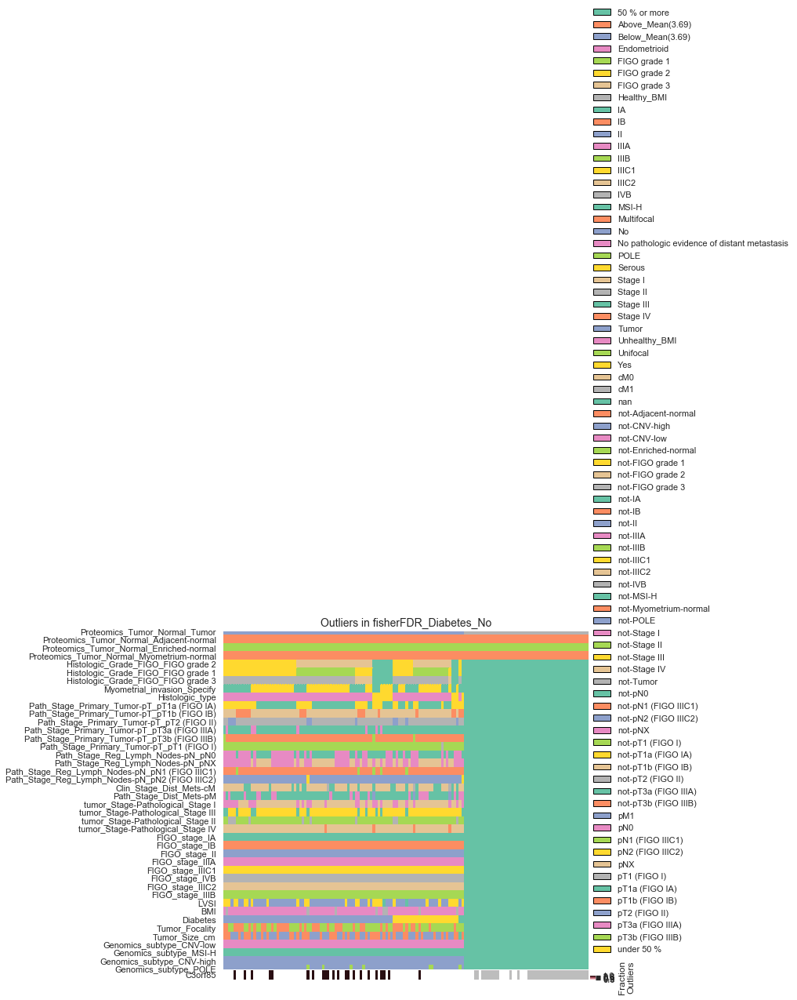

09/07/2019 14:25:38:WARNING:No significant genes at FDR 0.05 in fisherFDR_Diabetes_Yes
09/07/2019 14:25:39:WARNING:No significant genes at FDR 0.05 in fisherFDR_Tumor_Focality_Unifocal
09/07/2019 14:25:39:WARNING:No significant genes at FDR 0.05 in fisherFDR_Tumor_Focality_Multifocal


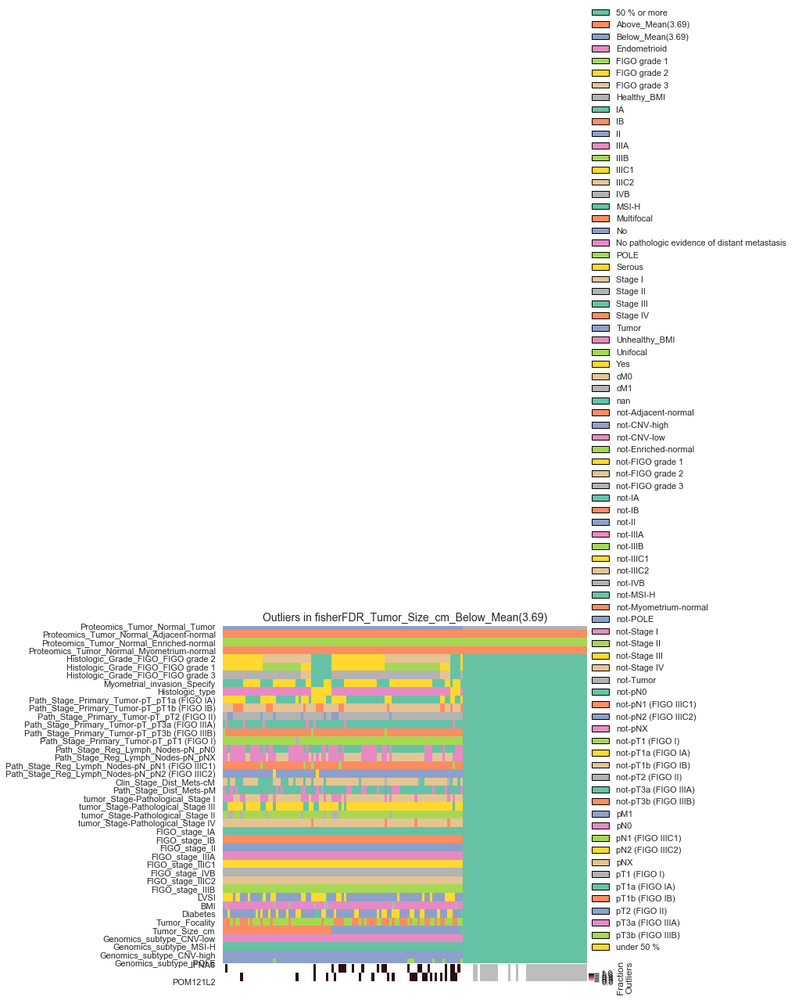

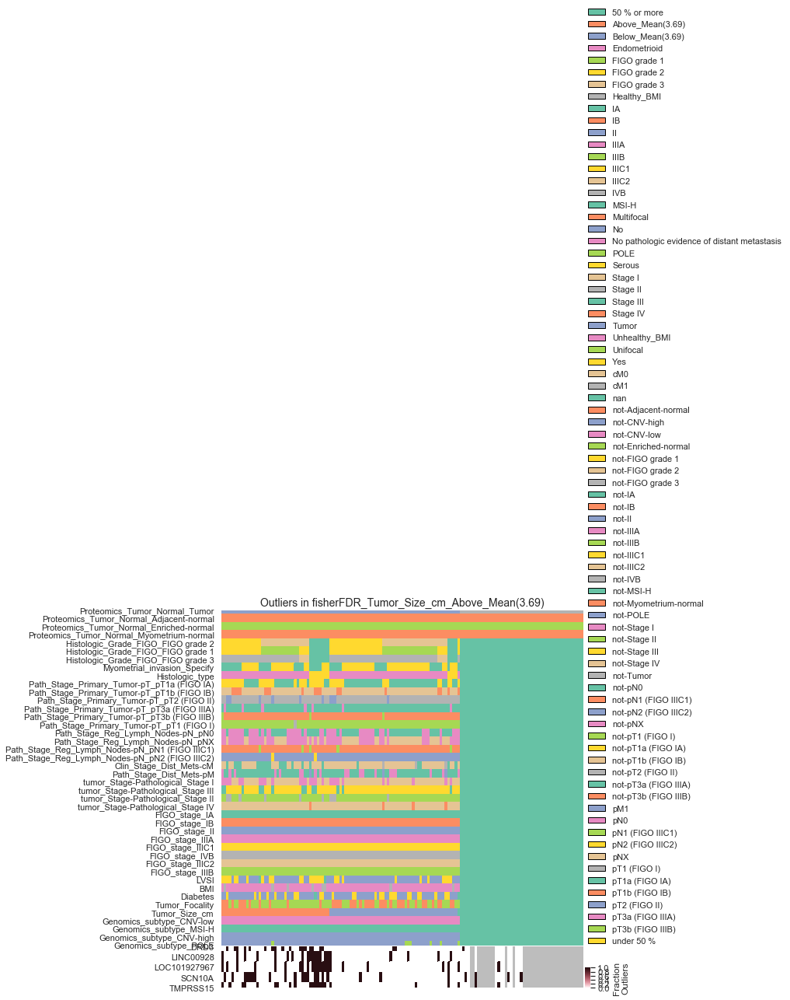

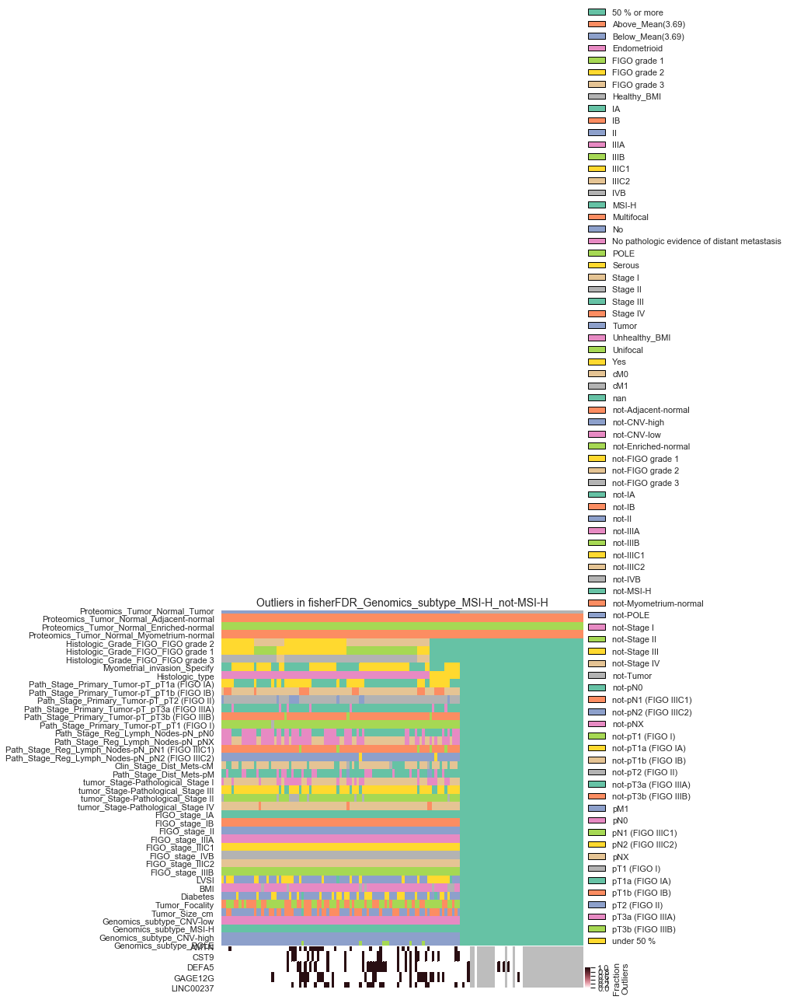

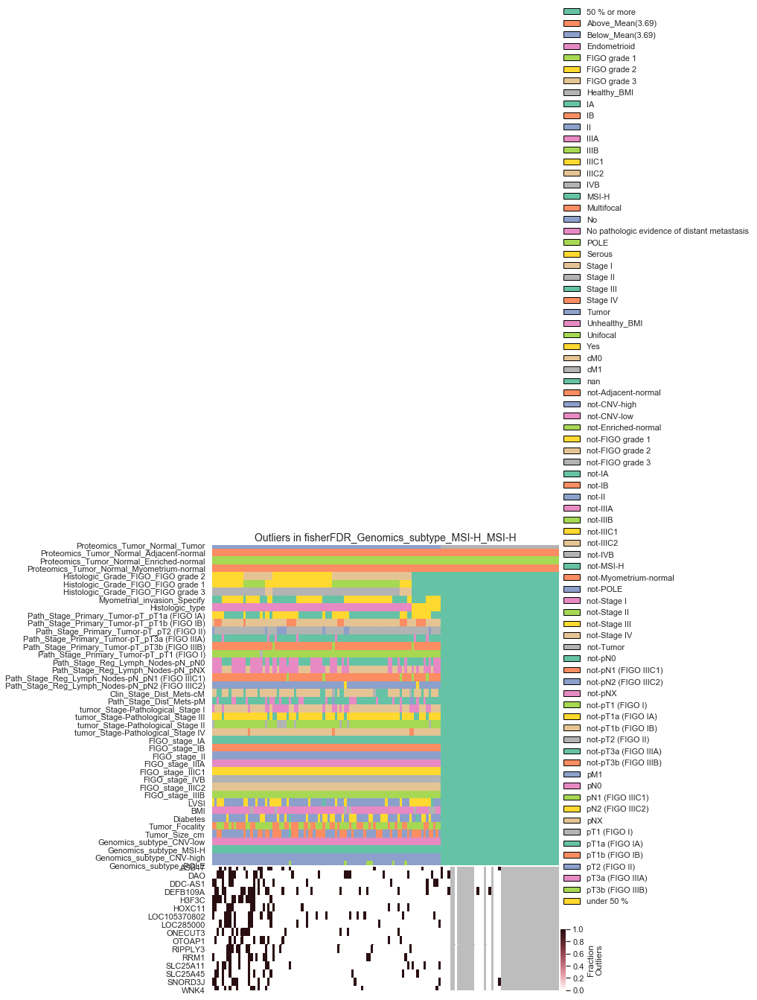

09/07/2019 14:26:15:WARNING:No significant genes at FDR 0.05 in fisherFDR_Genomics_subtype_POLE_not-POLE


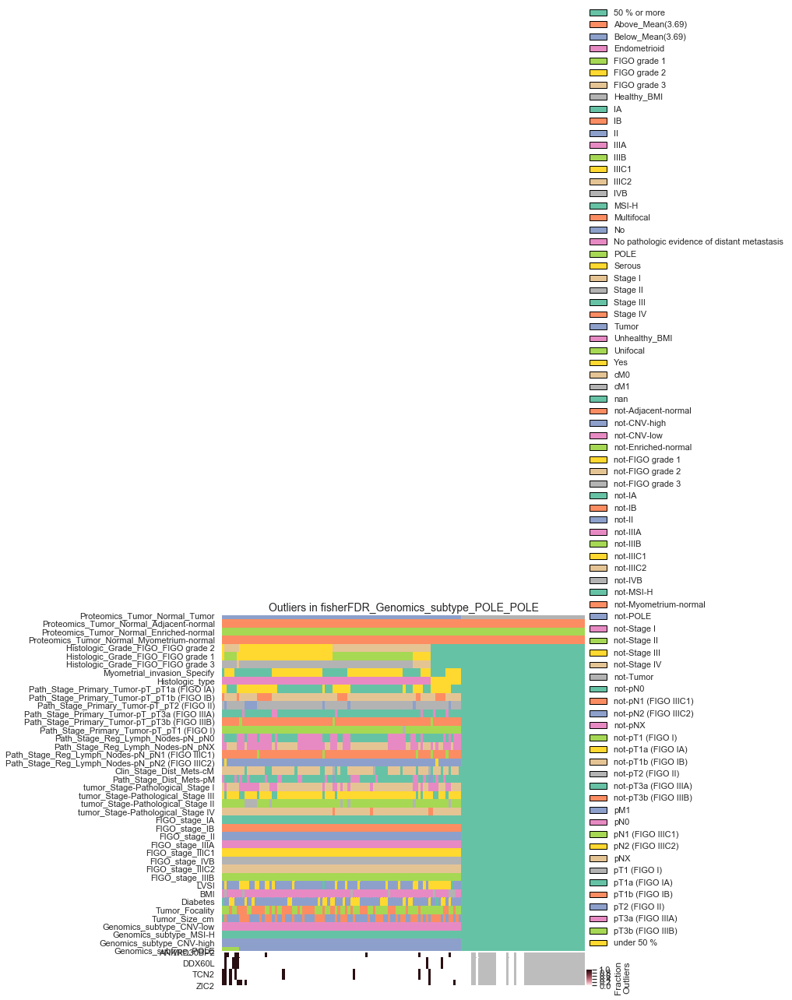

In [16]:
#Deva package visualization
for col in qvalues.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues.df,
    col_of_interest=col,
    vis_table=outliers.frac_table)
    
    plt.show()
    plt.close()

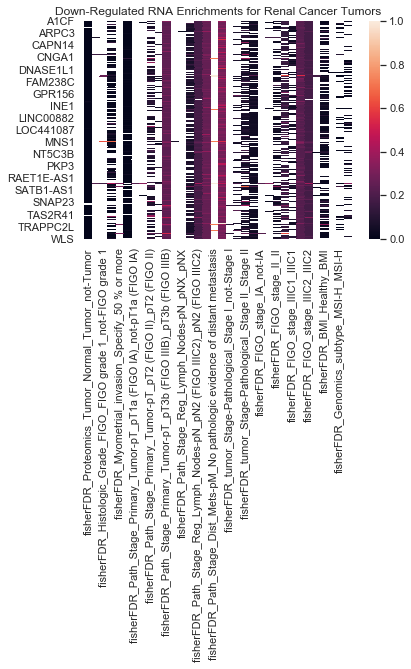

In [17]:
ax2 = plt.axes()
sns.heatmap(results_down, ax = ax2)
ax2.set_title('Down-Regulated RNA Enrichments for Renal Cancer Tumors')
plt.show()

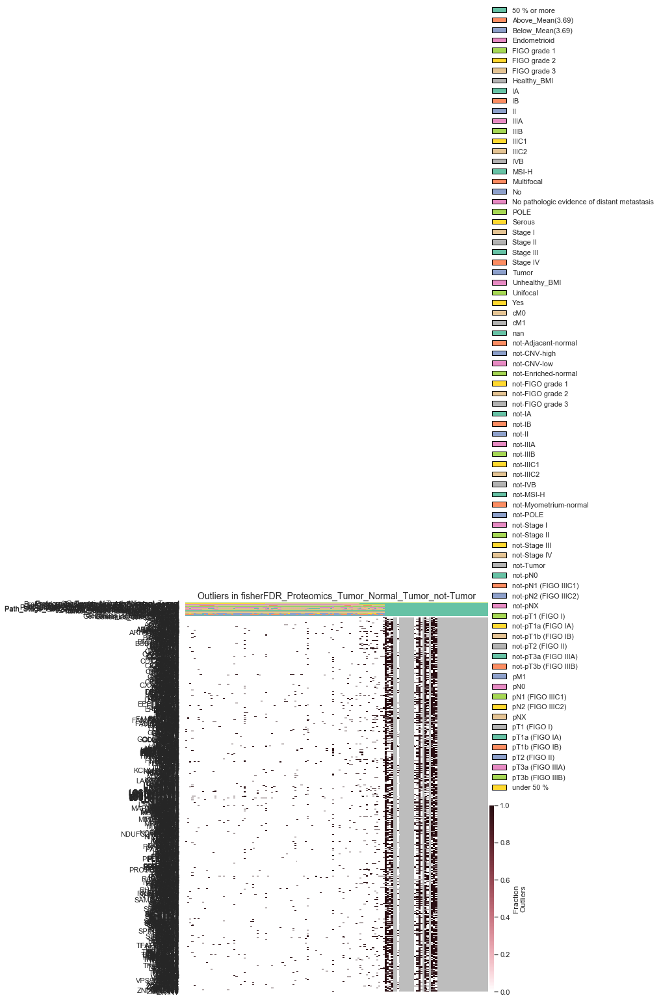

09/07/2019 14:27:29:WARNING:No significant genes at FDR 0.05 in fisherFDR_Histologic_Grade_FIGO_FIGO grade 2_FIGO grade 2
09/07/2019 14:27:30:WARNING:No significant genes at FDR 0.05 in fisherFDR_Histologic_Grade_FIGO_FIGO grade 1_not-FIGO grade 1


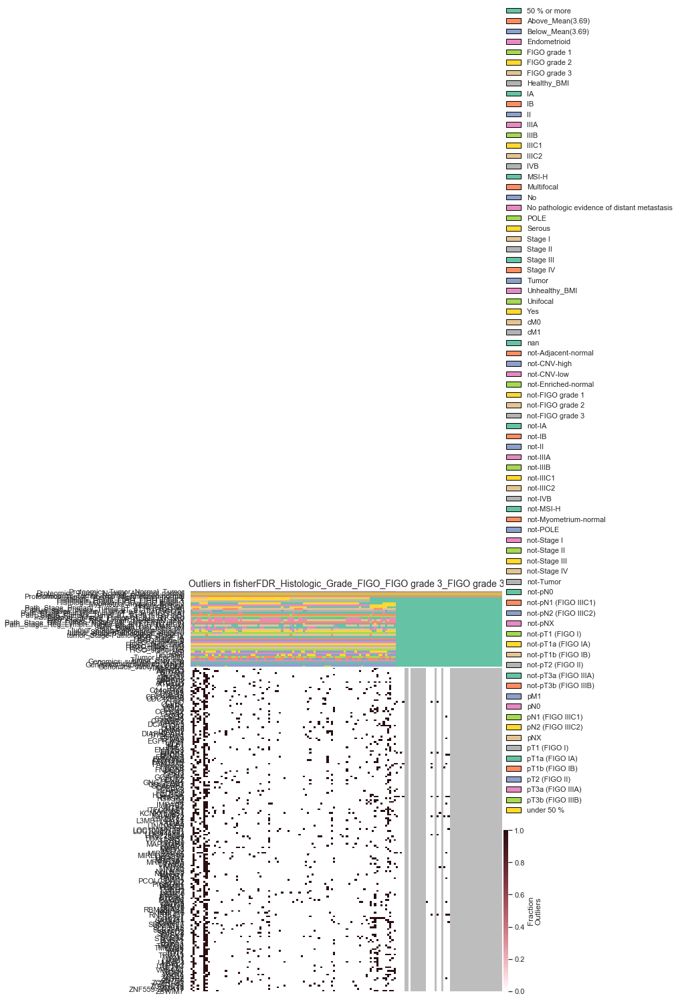

09/07/2019 14:27:45:WARNING:No significant genes at FDR 0.05 in fisherFDR_Myometrial_invasion_Specify_50 % or more


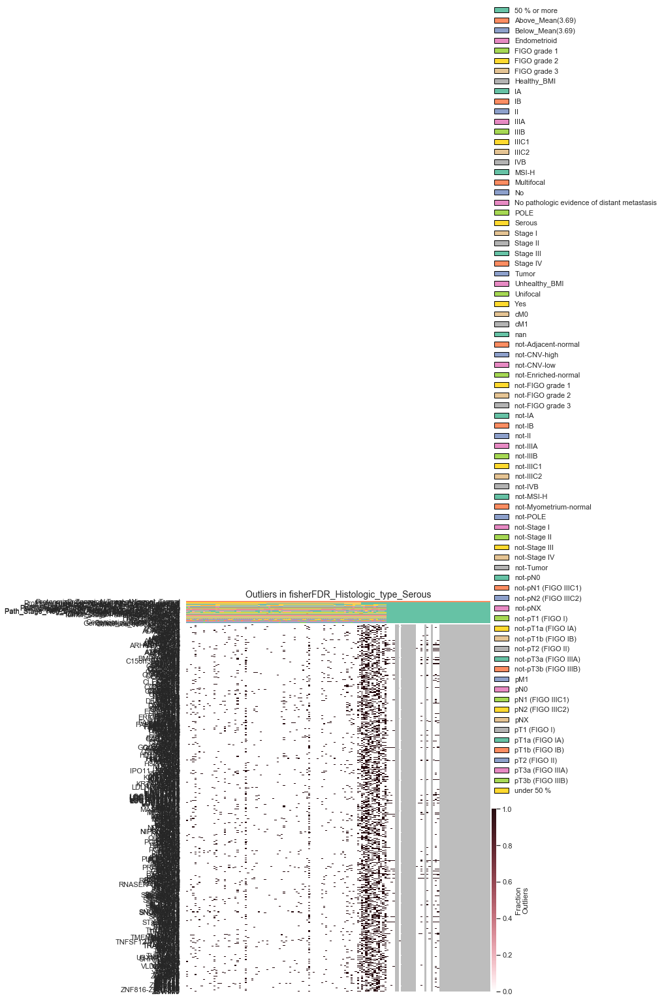

09/07/2019 14:28:25:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT1a (FIGO IA)_not-pT1a (FIGO IA)


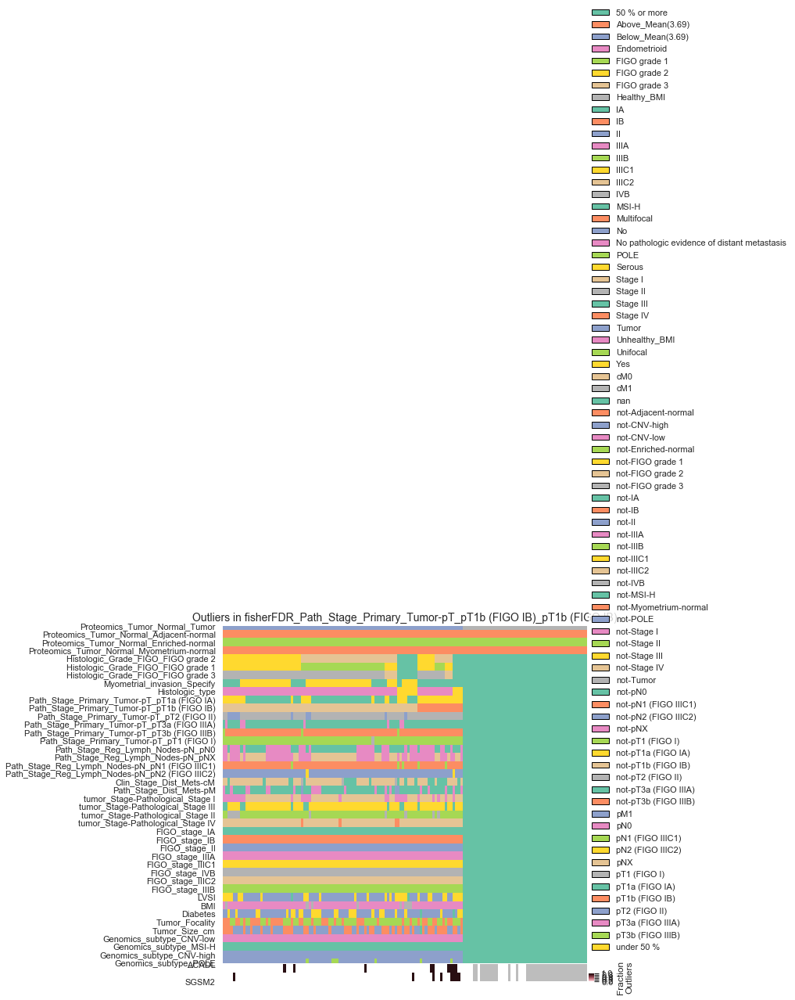

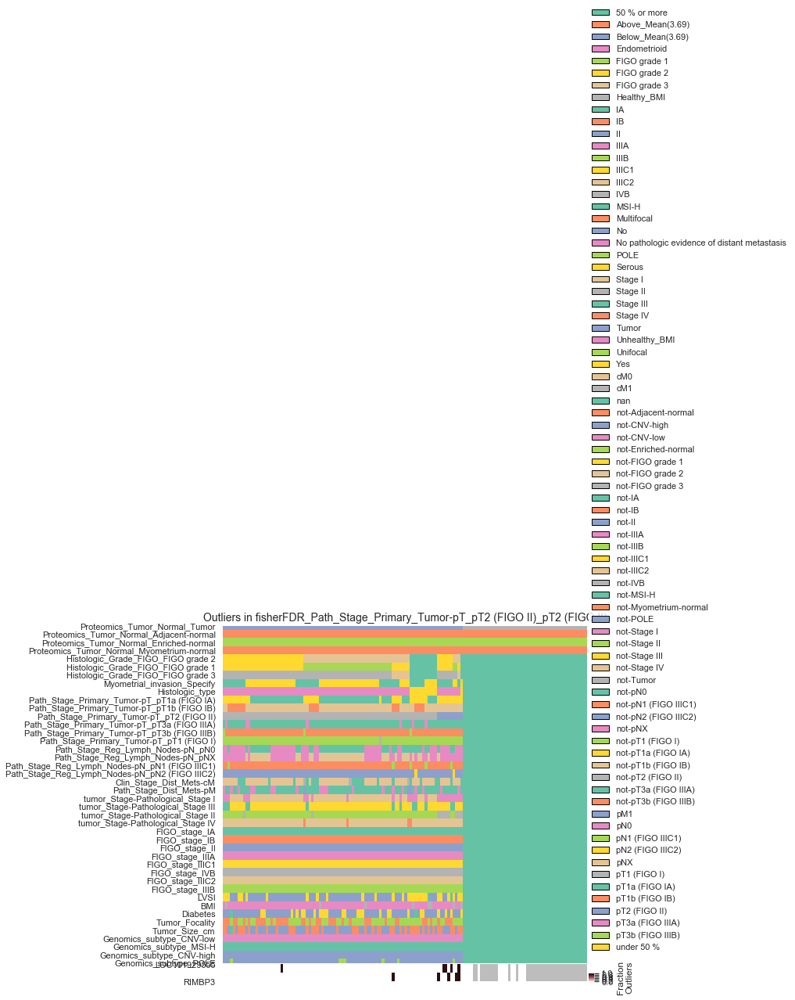

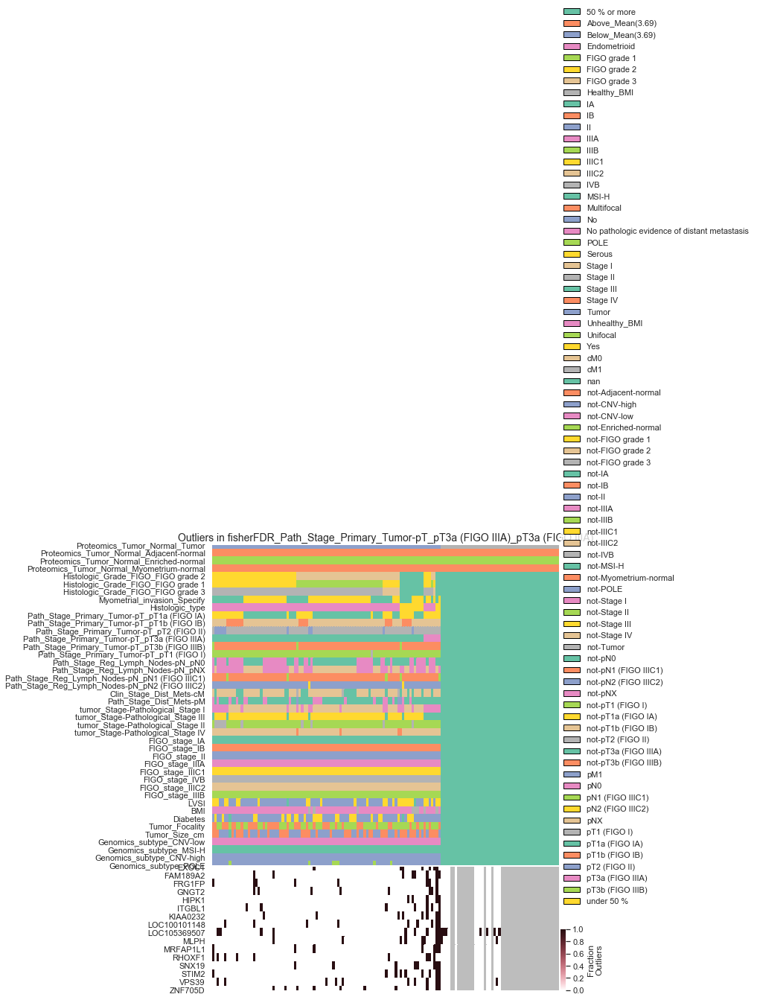

09/07/2019 14:28:51:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Primary_Tumor-pT_pT3b (FIGO IIIB)_pT3b (FIGO IIIB)
09/07/2019 14:28:52:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pN0_pN0


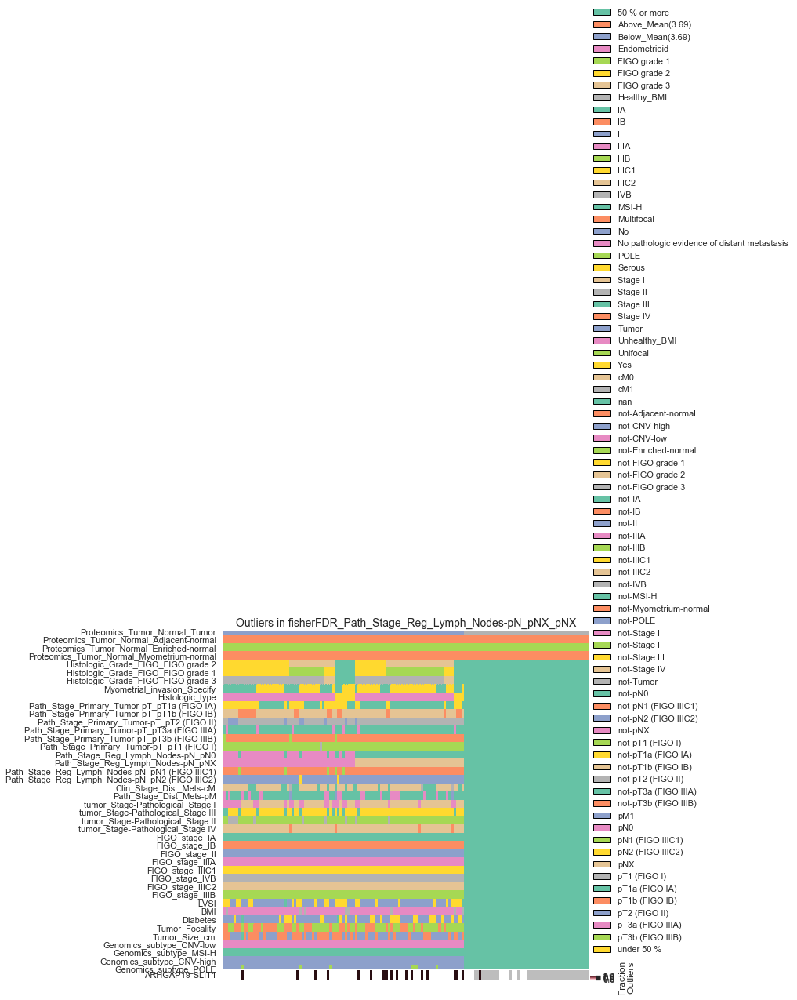

09/07/2019 14:29:00:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pN1 (FIGO IIIC1)_pN1 (FIGO IIIC1)
09/07/2019 14:29:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Reg_Lymph_Nodes-pN_pN2 (FIGO IIIC2)_pN2 (FIGO IIIC2)
09/07/2019 14:29:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Clin_Stage_Dist_Mets-cM_cM1
09/07/2019 14:29:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Dist_Mets-pM_No pathologic evidence of distant metastasis
09/07/2019 14:29:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Path_Stage_Dist_Mets-pM_pM1
09/07/2019 14:29:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_tumor_Stage-Pathological_Stage I_not-Stage I


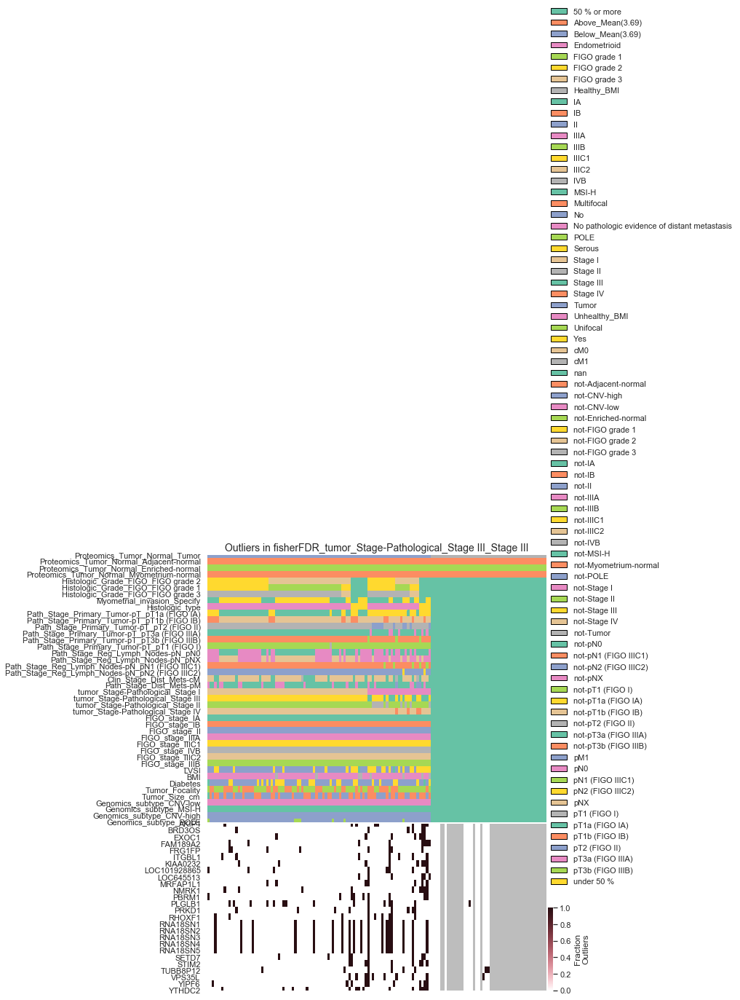

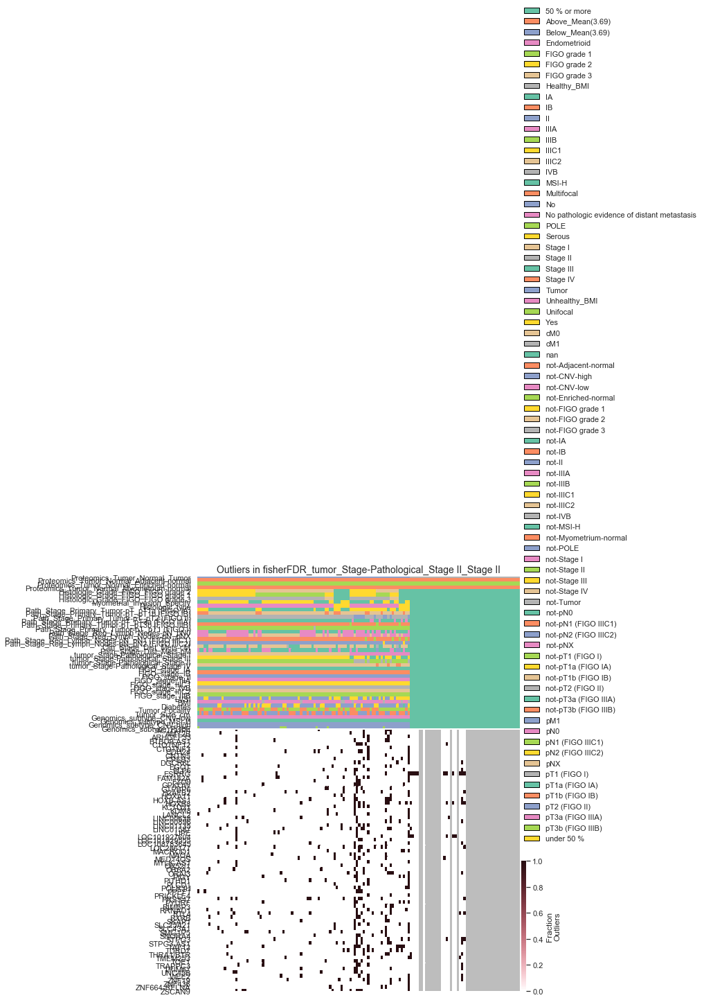

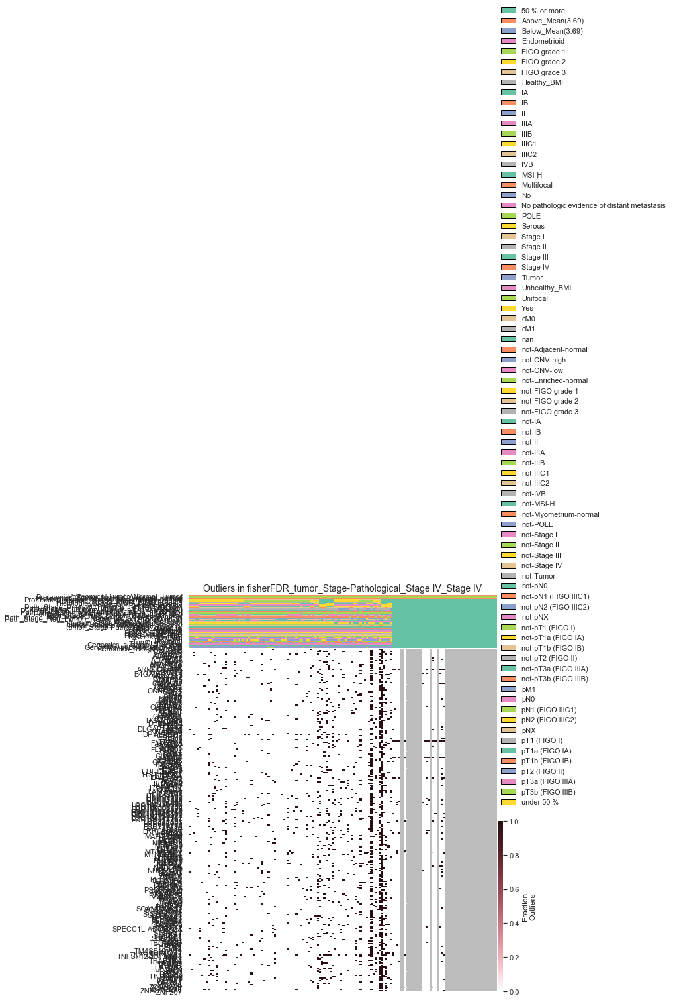

09/07/2019 14:29:40:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IA_not-IA


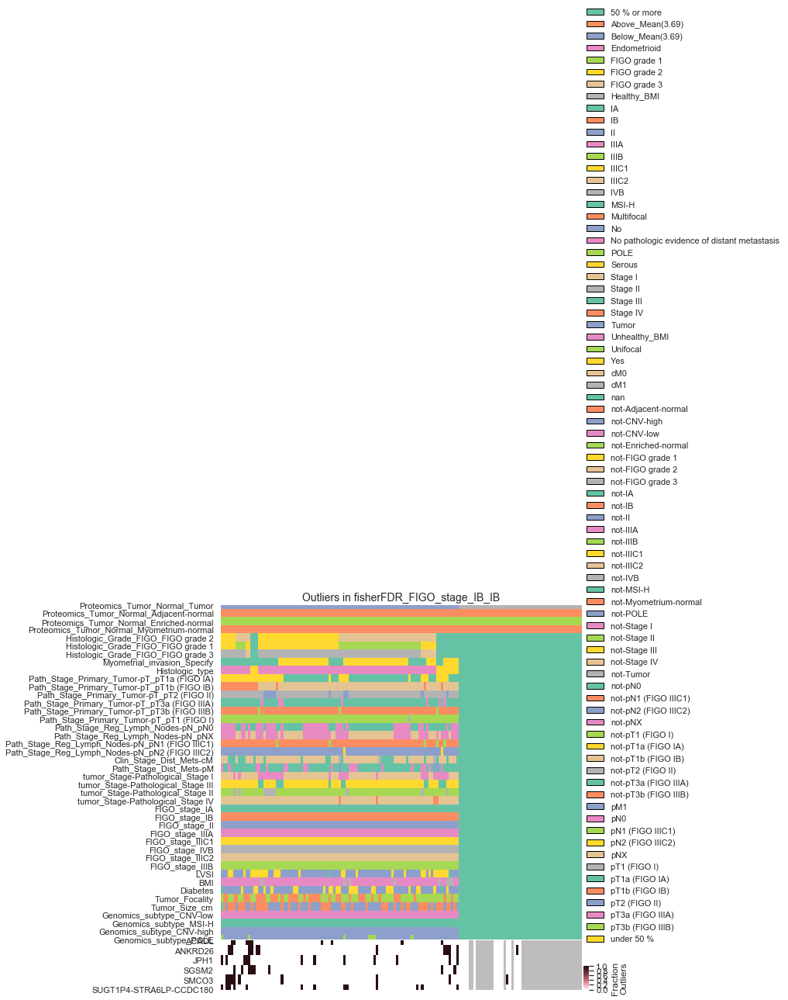

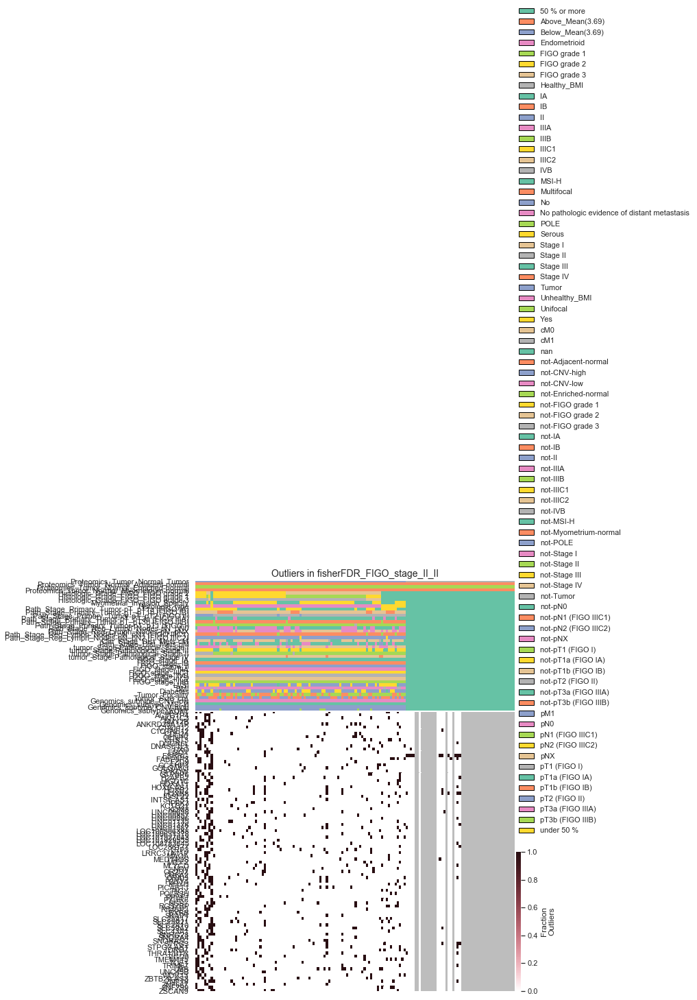

09/07/2019 14:30:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IIIA_IIIA


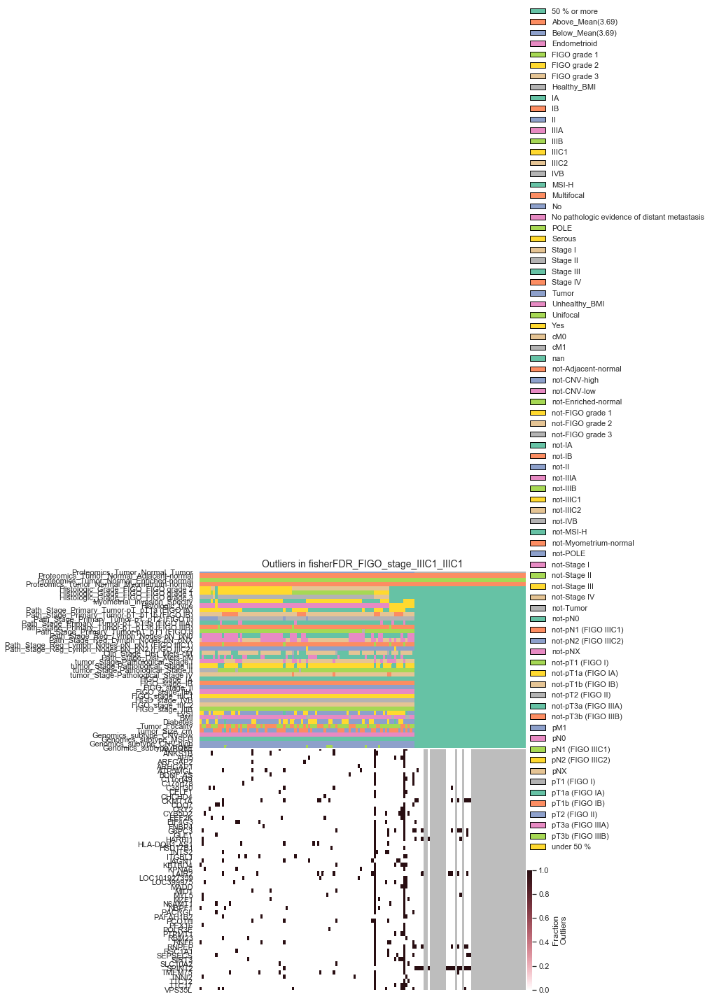

09/07/2019 14:30:12:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IVB_IVB
09/07/2019 14:30:12:WARNING:No significant genes at FDR 0.05 in fisherFDR_FIGO_stage_IIIC2_IIIC2


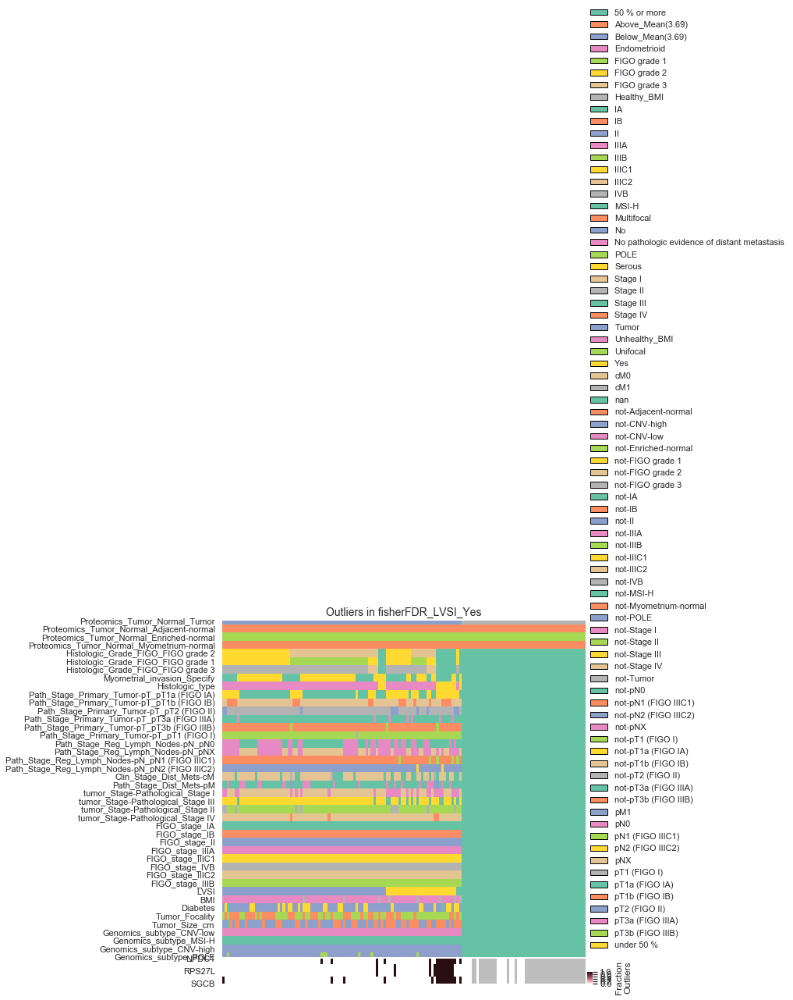

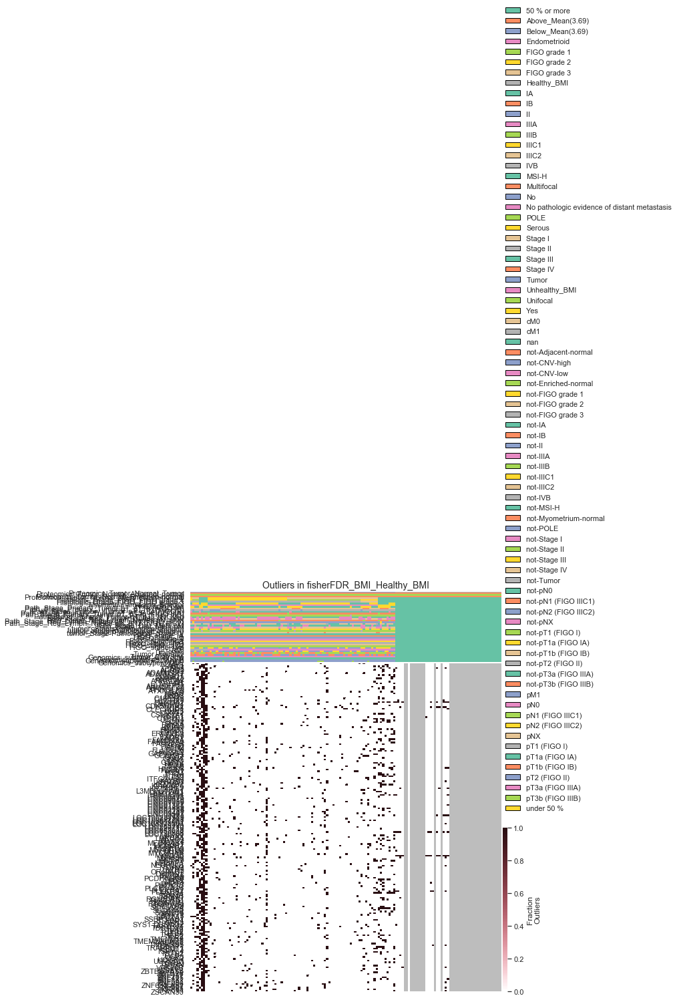

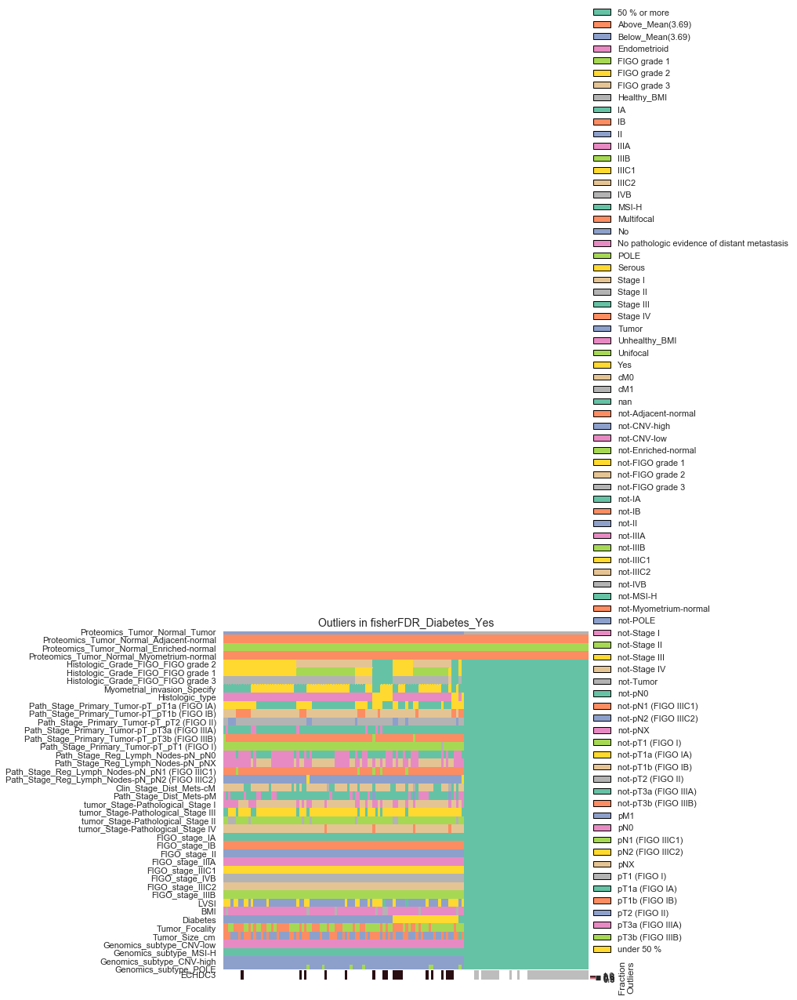

09/07/2019 14:30:45:WARNING:No significant genes at FDR 0.05 in fisherFDR_Tumor_Size_cm_Above_Mean(3.69)


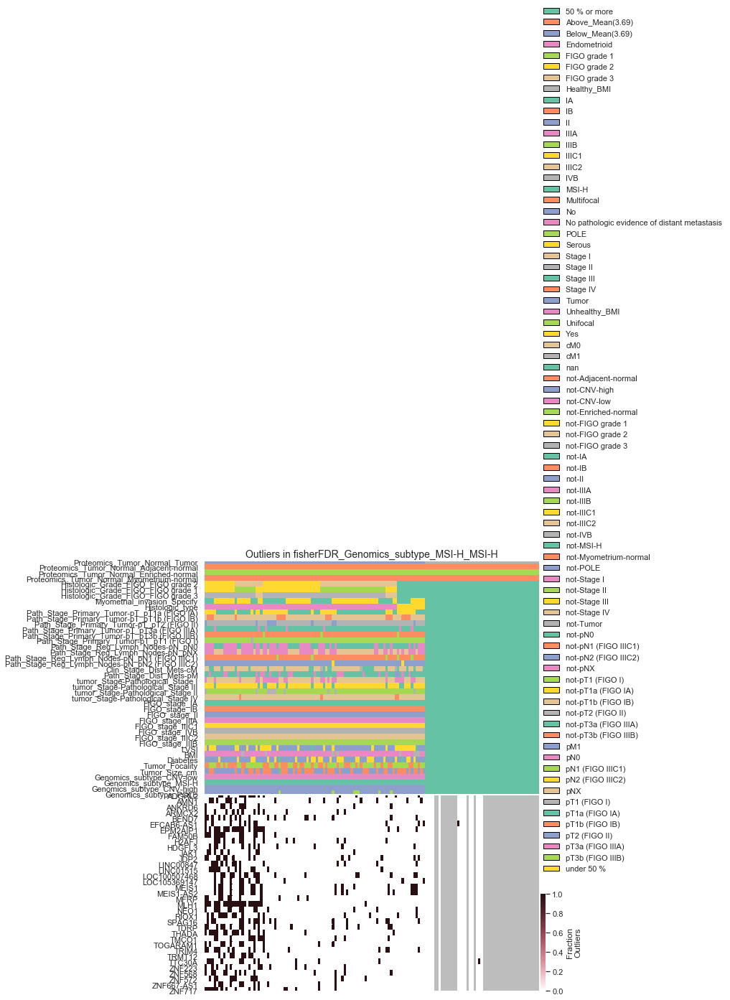

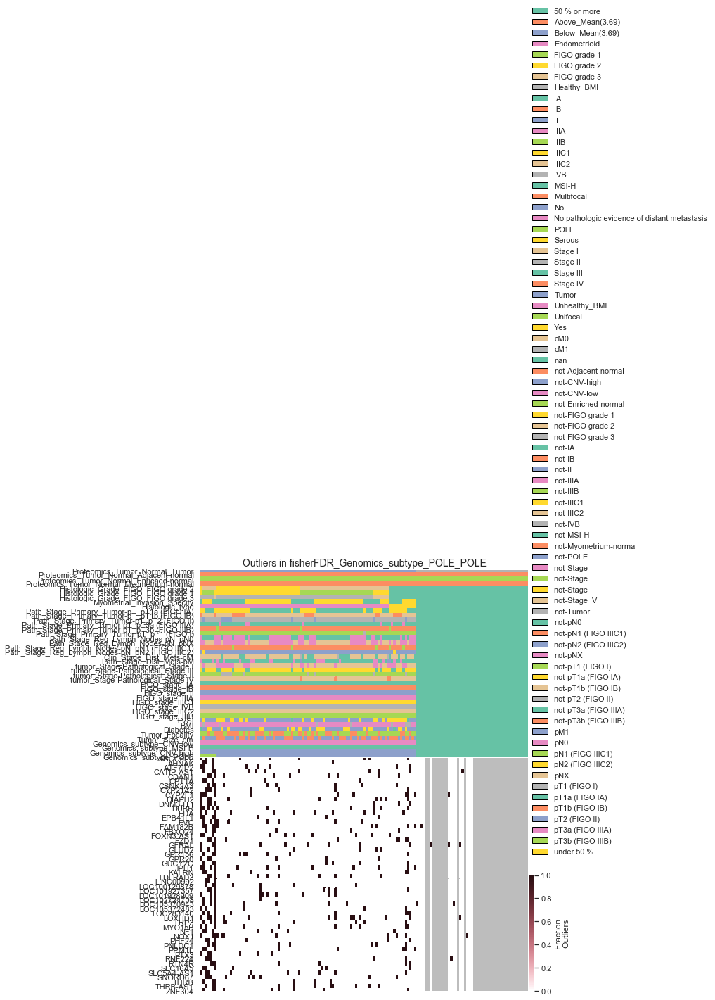

In [18]:
#Deva package visualization
for col in qvalues_down.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues_down.df,
    col_of_interest=col,
    vis_table=outliers_down.frac_table)
    
    plt.show()
    plt.close()

## Step 5: Perform Gene Set Enrichment Analysis

Part A: Up-regulated Genes

In [20]:
gsea_up = {}
for col in sig_cols_up:
    col_name = col.columns[0]
    col_name = "_".join(col_name.split(" "))
    print(col_name[:-9])
    gene_name_list = list(col.index)
    #print('Gene List:', gene_name_list, '\n')
    enrichment = gp.enrichr(gene_list = gene_name_list, 
                            description=col_name, 
                            gene_sets='KEGG_2019_Human', 
                            outdir='test/endo')
    gsea_up[col_name] = enrichment
    barplot(enrichment.res2d, title=col_name, ofname=col_name)

Proteomics_Tumor_Normal_Tumor_not-Tumor
Histologic_Grade_FIGO_FIGO_grade_1_not-FIGO_grade_1


2019-09-07 14:32:30,800 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:30:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Histologic_Grade_FIGO_FIGO_grade_3_FIGO_grade_3


2019-09-07 14:32:33,783 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:33:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Histologic_type_Serous
Path_Stage_Reg_Lymph_Nodes-pN_pN0_pN0


2019-09-07 14:32:43,750 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:43:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


FIGO_stage_IA_not-IA


2019-09-07 14:32:46,560 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:46:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


FIGO_stage_II_II


2019-09-07 14:32:49,448 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:49:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


LVSI_Yes


2019-09-07 14:32:52,379 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:32:52:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


BMI_Healthy_BMI
Tumor_Size_cm_Above_Mean(3.69)


2019-09-07 14:33:01,552 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:33:01:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Genomics_subtype_MSI-H_not-MSI-H


2019-09-07 14:33:04,419 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:33:04:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Genomics_subtype_MSI-H_MSI-H


2019-09-07 14:33:07,329 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:33:07:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Genomics_subtype_POLE_POLE


2019-09-07 14:33:10,229 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/07/2019 14:33:10:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Determine significant overlap for significantly up-regulated genes, first for patients with a history of cancer, and then for patients with invasive carcinoma.

In [21]:
gsea_sig_attributes = ['Proteomics_Tumor_Normal_Tumor_not-Tumor', 
                       'Histologic_type_Serous', 
                       'BMI_Healthy_BMI']

gsea_sig_up_dict = {}

for attribute in gsea_sig_attributes:
    attribute += '_P_values'
    temp_df = gsea_up[attribute].res2d
    sig_filter = temp_df['Adjusted P-value'] < 0.05
    sig_terms = temp_df[sig_filter]
    gsea_sig_up_dict[attribute] = sig_terms
    print(attribute)
    print(gsea_sig_up_dict[attribute][['Term', 'Overlap', 'Adjusted P-value']])
    print('\n')

Proteomics_Tumor_Normal_Tumor_not-Tumor_P_values
                         Term Overlap  Adjusted P-value
0  cGMP-PKG signaling pathway  30/166          0.000669


Histologic_type_Serous_P_values
                                Term Overlap  Adjusted P-value
0                      RNA transport  31/165          0.000083
1                         Proteasome   13/45          0.001028
2  Ribosome biogenesis in eukaryotes  20/101          0.001566


BMI_Healthy_BMI_P_values
                                Term Overlap  Adjusted P-value
0                      RNA transport  11/165          0.000084
1                         Proteasome    6/45          0.000430
2                        Spliceosome   7/134          0.020497
3  Ribosome biogenesis in eukaryotes   6/101          0.022152




In [22]:
gsea_terms_and_genes = {}

for attribute, vals in gsea_sig_up_dict.items():
    genes = vals['Genes']
    terms = vals['Term']
    terms_and_genes = {}
    for i, gene in enumerate(genes):
        terms_and_genes[terms[i]] = gene.split(';')
    gsea_terms_and_genes[attribute] = terms_and_genes

In [27]:
abnormal_tumor_dict = gsea_terms_and_genes['Proteomics_Tumor_Normal_Tumor_not-Tumor_P_values']
abnormal_tumor_dict

{'cGMP-PKG signaling pathway': ['ROCK2',
  'NPR2',
  'SRF',
  'IRS4',
  'ITPR1',
  'ADRA1D',
  'ADCY2',
  'ADRA1A',
  'SLC8A1',
  'MYLK',
  'SLC8A2',
  'RGS2',
  'EDNRA',
  'PPP3CB',
  'EDNRB',
  'PLN',
  'KCNMB1',
  'AKT3',
  'MEF2D',
  'PRKG1',
  'MEF2A',
  'MEF2C',
  'PPP1R12A',
  'KCNJ8',
  'PDE2A',
  'ADRA2C',
  'ADRB3',
  'KCNMA1',
  'MRVI1',
  'MYL9']}

In [24]:
serous_dict = gsea_terms_and_genes['Histologic_type_Serous_P_values']
serous_dict

{'Proteasome': ['PSMD11',
  'ADRM1',
  'PSMA7',
  'PSMB9',
  'PSMD8',
  'PSMB6',
  'PSMA6',
  'PSMC5',
  'PSMB3',
  'PSMD2',
  'PSMC1',
  'PSMD3',
  'PSMF1'],
 'RNA transport': ['SEH1L',
  'GEMIN2',
  'EIF4A3',
  'CASC3',
  'NUP160',
  'FXR1',
  'NXF2',
  'FXR2',
  'XPO1',
  'SUMO3',
  'TGS1',
  'SUMO2',
  'XPO5',
  'RAE1',
  'PRMT5',
  'NUP155',
  'NCBP2',
  'NUP153',
  'SENP2',
  'RANGAP1',
  'EIF1',
  'EIF5',
  'EIF4E1B',
  'EEF1A2',
  'EIF3J',
  'NXF2B',
  'GEMIN5',
  'NUP35',
  'ACIN1',
  'GEMIN6',
  'RNPS1'],
 'Ribosome biogenesis in eukaryotes': ['NOP56',
  'RBM28',
  'UTP6',
  'CSNK2A1',
  'PWP2',
  'GNL2',
  'WDR43',
  'NOL6',
  'FBL',
  'TBL3',
  'LSG1',
  'NXF2',
  'GNL3L',
  'XPO1',
  'DKC1',
  'CSNK2B',
  'NHP2',
  'NXF2B',
  'MPHOSPH10',
  'DROSHA']}

In [28]:
healthyBMI_dict = gsea_terms_and_genes['BMI_Healthy_BMI_P_values']
healthyBMI_dict

{'Proteasome': ['PSMA6', 'PSMD6', 'PSMC6', 'PSMD14', 'PSMC1', 'PSME1'],
 'RNA transport': ['SEH1L',
  'EIF5',
  'NUP155',
  'NCBP2',
  'EIF3I',
  'EIF3J',
  'THOC3',
  'NUP98',
  'EIF2S1',
  'THOC7',
  'EIF3B'],
 'Ribosome biogenesis in eukaryotes': ['NOP56',
  'DKC1',
  'WDR3',
  'FCF1',
  'NAT10',
  'GNL3'],
 'Spliceosome': ['EFTUD2',
  'PPIL1',
  'PRPF6',
  'NCBP2',
  'THOC3',
  'SNRPB2',
  'TXNL4A']}

## Step 6: Connect Findings with Druggable Genome Interactive Database (DGIdb)

In [29]:
abnormal_tumor_requests = {}
abnormal_tumor_requests_parsed = {}
for term, gene_list in abnormal_tumor_dict.items():
    abnormal_tumor_requests[term] = bf.dgidb_get_request(gene_list)
    abnormal_tumor_requests_parsed[term] = bf.dgidb_json_parse(abnormal_tumor_requests[term], genes=True)

print(json.dumps(abnormal_tumor_requests_parsed, indent=4))

{
    "cGMP-PKG signaling pathway": {
        "ROCK2": {
            "FASUDIL": [
                "inhibitor"
            ],
            "GSK-269962A": [
                "inhibitor"
            ],
            "CHEMBL2005186": [
                "inhibitor"
            ],
            "NETARSUDIL": [
                "inhibitor"
            ],
            "SAR-407899 (CHEMBL1667969)": [
                "inhibitor"
            ],
            "VEROSUDIL": [
                "inhibitor"
            ],
            "Y-27632": [
                "inhibitor"
            ],
            "Y-39983": [
                "inhibitor"
            ],
            "AMA0076": [
                "inhibitor"
            ],
            "AT-13148": [
                "inhibitor"
            ],
            "SAR-407899 (CHEMBL3545341)": [
                "inhibitor"
            ],
            "DE-104": [
                "inhibitor"
            ],
            "THROMBIN": [],
            "PROGESTERONE": []
        },
    

}


In [30]:
serous_requests = {}
serous_requests_parsed = {}
for term, gene_list in serous_dict.items():
    serous_requests[term] = bf.dgidb_get_request(gene_list, anti_neoplastic=True)
    serous_requests_parsed[term] = bf.dgidb_json_parse(serous_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(serous_requests_parsed, indent=4))

Parsed Requests:

{
    "RNA transport": null,
    "Proteasome": {
        "PSMD11": {
            "OPROZOMIB": [
                "inhibitor"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ]
        },
        "ADRM1": {
            "OPROZOMIB": [
                "inhibitor"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ]
        },
        "PSMA7": {
            "OPROZOMIB": [
                "inhibitor"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ]
        },
        "PSMB9": {
            "OPROZOMIB": [
                "inhibitor"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "

In [31]:
healthyBMI_requests = {}
healthyBMI_requests_parsed = {}
for term, gene_list in healthyBMI_dict.items():
    healthyBMI_requests[term] = bf.dgidb_get_request(gene_list)
    healthyBMI_requests_parsed[term] = bf.dgidb_json_parse(healthyBMI_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(healthyBMI_requests_parsed, indent=4))

Parsed Requests:

{
    "RNA transport": {
        "EIF2S1": {
            "STAUROSPORINE": []
        }
    },
    "Proteasome": {
        "PSMA6": {
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "OPROZOMIB": [
                "inhibitor"
            ],
            "MARIZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ],
            "IXAZOMIB CITRATE": [
                "inhibitor"
            ]
        },
        "PSMD6": {
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ],
            "OPROZOMIB": [
                "inhibitor"
            ],
            "IXAZOMIB CITRATE": [
                "inhibitor"
            ]
        },
        "PSMC6": {
            "OPROZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ],

## Step 7: Personalized Medicine

In [33]:
sig_genes_up

{'BMI_Healthy_BMI': ['AATF',
  'ABCF2',
  'ACY1',
  'ADGRL2',
  'ALKBH1',
  'ANAPC1',
  'AP3B2',
  'ASCC3',
  'ATAD3B',
  'ATP13A1',
  'BORCS8',
  'BZW2',
  'C19orf44',
  'C1orf167',
  'C9orf66',
  'CACNA1A',
  'CCT4',
  'CDKAL1',
  'CDV3',
  'CELA3A',
  'CINP',
  'CMSS1',
  'COA7',
  'COMMD1',
  'CTRB2',
  'DCAF4',
  'DDX18',
  'DDX21',
  'DKC1',
  'DNAJA3',
  'DRAM1',
  'DSCC1',
  'EAF1',
  'EFTUD2',
  'EIF2S1',
  'EIF3B',
  'EIF3I',
  'EIF3J',
  'EIF5',
  'ELL',
  'EMC3',
  'ERAL1',
  'EXOC3L4',
  'FAM210A',
  'FAM27C',
  'FAM50A',
  'FCF1',
  'GABPB1',
  'GAD2',
  'GART',
  'GC',
  'GCDH',
  'GGCX',
  'GHSR',
  'GNL3',
  'GPN1',
  'GPR142',
  'GRPEL1',
  'HSPBP1',
  'IDH3G',
  'IFNL2',
  'IMPDH2',
  'IWS1',
  'KIAA0100',
  'KPNA1',
  'LHFPL3',
  'LINC00472',
  'LINC00638',
  'LINC02192',
  'LINC02274',
  'LINC02317',
  'LINGO1-AS2',
  'LOC101927151',
  'LOC102724908',
  'LOC105373553',
  'LOC284578',
  'LOC613266',
  'LOC644669',
  'LOC728554',
  'LYAR',
  'MAPKAPK3',
  'MAPRE1',
 

In [44]:
error_columns = ['Histologic_type_Serous', 
                 'Proteomics_Tumor_Normal_Tumor_not-Tumor']

1376

In [48]:
bf.dgidb_get_request(sig_genes_up['Histologic_type_Serous'])

Invalid parameter value: 
Expecting value: line 1 column 1 (char 0)

Required Parameters:
genes_or_drugs_list (list)

One of the following:
genes (bool) OR drugs (bool)

Optional Parameters:
interaction_sources (list (case-sensitive): ["DrugBank","PharmGKB","TALC","TEND","TTD"])
interaction_types (list (not case-sensitive): ["activator", "inhibitor", "unknown"])
fda_approved_drug (bool)
immunotherapy (bool)
anti_neoplastic (bool)
clinically_actionable (bool)
druggable_genome (bool)
drug_resistance (bool)
gene_categories (list (not case-sensitive): ["kinase", "dna repair", "tumor suppressor"])
source_trust_levels (list (not case-sensitive): ["Expert curated", "Non-curated"])

For more information on function parameters and DGIdb, see:
http://www.dgidb.org/api


In [32]:
# To perform a request specifically for inhibitors, you may opt to use a loop
# While this option is slower than the map, it is more specific, and may be worth
# waiting a few more seconds to reduce manual sifting through interaction types
inhibitors = {}
for attribute, genes in sig_genes_up.items():
    inhibitors[attribute] = bf.dgidb_get_request(genes, interaction_types=['inhibitor'])

Invalid parameter value: 
Expecting value: line 1 column 1 (char 0)

Required Parameters:
genes_or_drugs_list (list)

One of the following:
genes (bool) OR drugs (bool)

Optional Parameters:
interaction_sources (list (case-sensitive): ["DrugBank","PharmGKB","TALC","TEND","TTD"])
interaction_types (list (not case-sensitive): ["activator", "inhibitor", "unknown"])
fda_approved_drug (bool)
immunotherapy (bool)
anti_neoplastic (bool)
clinically_actionable (bool)
druggable_genome (bool)
drug_resistance (bool)
gene_categories (list (not case-sensitive): ["kinase", "dna repair", "tumor suppressor"])
source_trust_levels (list (not case-sensitive): ["Expert curated", "Non-curated"])

For more information on function parameters and DGIdb, see:
http://www.dgidb.org/api
Invalid parameter value: 
Expecting value: line 1 column 1 (char 0)

Required Parameters:
genes_or_drugs_list (list)

One of the following:
genes (bool) OR drugs (bool)

Optional Parameters:
interaction_sources (list (case-sensitiv

In [31]:
print('UP-REGULATED INHIBITOR REQUEST:\n')
inhibitors_parsed = {}
for attribute, request in inhibitors.items():
    inhibitors_parsed[attribute] = bf.dgidb_json_parse(request, genes=True)
print(json.dumps(inhibitors_parsed, indent=4))

UP-REGULATED INHIBITOR REQUEST:

{
    "Proteomics_Tumor_Normal_Tumor_not-Tumor": {
        "MAP2K7": {
            "AZD-8330": [
                "inhibitor"
            ],
            "BINIMETINIB": [
                "inhibitor"
            ],
            "DABRAFENIB MESYLATE": [
                "inhibitor"
            ],
            "COBIMETINIB": [
                "allosteric modulator",
                "inhibitor"
            ],
            "PD-0325901": [
                "inhibitor"
            ],
            "TRAMETINIB": [
                "inhibitor"
            ],
            "Refametinib": [
                "inhibitor"
            ],
            "IODOACETAMIDE": [
                "inhibitor"
            ],
            "SELUMETINIB": [
                "inhibitor"
            ]
        }
    },
    "Histologic_Grade_FIGO_FIGO grade 3_FIGO grade 3": {
        "CYP2J2": {
            "TERFENADINE": [
                "inhibitor"
            ]
        },
        "EIF2AK2": {
       

}


In [32]:
random.seed(8)
patients_to_check_up = []
for i in range(3):
    index = random.randrange(0, len(only_outliers_up))
    while clinical.index[index] not in outliers_up_dict.keys() and index < len(outliers_up_dict.keys()):
        index += 1
    patients_to_check_up.append(clinical.index[index])

In [33]:
personalized_up = {}
for patient in patients_to_check_up:
    patients_up_dict = bf.dgidb_get_request(outliers_up_dict[patient], 
                                            interaction_types = ['inhibitor'])
    parsed = bf.dgidb_json_parse(patients_up_dict, genes=True)
    personalized_up[patient] = parsed
print(json.dumps(personalized_up, indent = 4))

{
    "S066": {
        "ADA": {
            "CLADRIBINE": [
                "inhibitor"
            ],
            "DIPYRIDAMOLE": [
                "inhibitor"
            ],
            "EHNA": [
                "inhibitor"
            ],
            "PENTOSTATIN": [
                "inhibitor"
            ],
            "FLUDARABINE": [
                "inhibitor"
            ]
        },
        "AKR1A1": {
            "FOMEPIZOLE": [
                "inhibitor"
            ]
        },
        "AKR1C1": {
            "SALICYLIC ACID": [
                "inhibitor"
            ],
            "ASPIRIN": [
                "inhibitor"
            ]
        },
        "ATP6V1A": {
            "TILUDRONIC ACID": [
                "inhibitor"
            ],
            "BAFILOMYCIN A1": [
                "inhibitor"
            ],
            "BAFILOMYCIN B1": [
                "inhibitor"
            ]
        },
        "ATP6V1B2": {
            "GALLIUM NITRATE": [
                "i

}
